# Classifying Bird Species in Singapore
### CE7454 Data Science Project
#### Group 14: Davide Coppola, Mitra Tajrobehkar, Shuang Wu

# Table of Contents
- [Motivation](#Motivation)
- [Data Acquisition](#Data-Acquisition)
    - [Who lives on the island?](#Who-lives-on-the-island?)
    - [What species to choose?](#What-species-to-choose?)
    - [Web scraping](#Web-scraping)
        - [IBC](#IBC)
        - [Flickr](#Flickr)
    - [Acquired Dataset](#Acquired-dataset)
- [Data Exploration and Visualization](#Data-Exploration-and-Visualization)
    - [Counting the samples](#Counting-the-samples)
    - [Simple visualization](#Simple-visualization)
    - [Cool visualization](#Cool-visualization)
    - [Image tile visualization](#Image-tile-visualization)
- [Data Validation](#Data-Validation)
    - [Removing minority classes](#Removing-minority-classes)
    - [Web App](#Web-App)
        - [Application features](#Application-features)
        - [Running the app](#Running-the-app)
    - [Joining the results from the app](#Joining-the-results-from-the-app)
- [Classification](#Classification)
    - [Loading dataset](#Loading-dataset)
    - [Classification with Softmax Cross Entropy Loss](#Classification-with-Softmax-Cross-Entropy-Loss)
    - [Classification with Triplet Loss](#Classification-with-Triplet-Loss)
- [Summary and Analysis of Results](#Summary-of-Results)
    - [Superior Performance of Triplet Loss Classifier over Softmax Classifier](#Superior-Performance-of-Triplet-Loss-Classifier-over-Softmax-Classifier)
    - [Similar Perfomance with ResNet50 and VGG16](#Similar-Perfomance-with-ResNet50-and-VGG16)
    - [Triplet Loss Generalization](#Triplet-Loss-Generalization)

In [5]:
import pandas as pd
import requests
import bs4
from tqdm import tqdm
import os
import json
import shutil
from PIL import Image, ImageDraw, ImageFont, ImageFile
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import seaborn as sns
import numpy as np
import math
import tensorflow as tf
from glob import glob
import os
from IPython.display import display_html
import itertools
from collections import defaultdict
import keras_preprocessing.image
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K
from keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.python.keras.preprocessing.image import load_img, img_to_array
from tensorflow.python.keras.applications import ResNet50
from tensorflow.python.keras.applications.resnet50 import preprocess_input
from tensorflow.python.keras.applications.vgg16 import VGG16
from tensorflow.python.keras.applications.vgg16 import preprocess_input as vgg_preprocess_input, decode_predictions
from tensorflow.python.keras.models import Sequential, Model
from tensorflow.python.keras.layers import Dense, Flatten, BatchNormalization, Input, Dropout, Lambda, GlobalAveragePooling2D
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import normalize
from sklearn.neighbors import NearestNeighbors
from skimage import exposure

# The following resolves the issue of possibly truncated images in the datasets
ImageFile.LOAD_TRUNCATED_IMAGES = True

% matplotlib inline

Using TensorFlow backend.


# Motivation

Go back to [Table of Contents](#Table-of-Contents)

Singapore is a vibrant tropical country that, in spite of its urbanization, offers a paradise for nature lovers. In particular, its nature reserves are home to a host of different species of birds, attracting birdwatchers, nature enthusiasts and simple weekend hikers from all over the world. The official website of [Singapore's National Parks](https://www.nparks.gov.sg/biodiversity/wildlife-in-singapore/species-list/bird) catalogs over 400 different bird species that can be found on the island. Thus, it happens frequently to take a picture or see a bird flying in the wild and not being able to recognize the species.

The aim of this project is to develop a classification system for bird species that are specific to Singapore. This could be the starting point of an application for photographers and bird enthusiasts.

![](https://www.nparks.gov.sg/-/media/biodiversity/bird-species.jpg?h=270&w=547&la=en&hash=6CF0690D75504F47D0966F247166DC34B1BB4B41 "Header of species list from SNP website.")


# Data Acquisition

At the time of writing, there isn't any publicly available dataset that is specific to the bird species in Singapore. So, it was necessary to build one from scratch.

The only other avaialble "bird species" dataset consists of species from North America, thus has completely different species due to environmental factors.

Go back to [Table of Contents](#Table-of-Contents)

## Who lives on the island?
The already mentioned National Parks website proved an exellent resource with its comprehensive list of the species living on the island. Furthermore, the table also includes other details such as the abundance or its vulnerability.

Luckily, the table was formatted well enough that a simple copy-paste in an editor like Microsoft Excel was enough to acquire this data. However, some work was still necessary to have a python-ready well fromatted dataset for our queries.

After the copying from the website, the table looked like this.

In [2]:
df = pd.read_csv('BirdSpecies_original.csv', sep=";")
df.head(14)

,No.,Common Name,Scientific Name,Abundance,Status
0,Family Anatidae,NaN,NaN,NaN,NaN
1,1,Wandering Whistling Duck,Dendrocygna arcuata,U,I? RB
2,2,Lesser Whistling Duck ##,Dendrocygna javanica,U,RB
3,3,Cotton Pygmy Goose ##,Nettapus coromandelianus,R,R(B)
4,4,Gadwall,Anas strepera,R,ACC
5,5,Eurasian Wigeon,Anas penelope,R,ACC
6,6,Northern Shoveler,Anas clypeata,R,WV
7,7,Northern Pintail,Anas acuta,R,WV
8,8,Garganey,Anas querquedula,R,WV
9,9,Eurasian Teal,Anas crecca,R,WV


There are a few things to adjust, for example:

- The **No.** column contains the information about the families. These are extracted using a concatenation of simple pandas functions.
- Some hidden characters that need to be removed to avoid future trouble.
    - It can be noted that some families have a *\xa0* special character that need to be removed to avoid problems in the future.
- Adding a new **Family** column to match each species to its family;
    - Given the index of a family *i*, it is easy to notice that the species between the index *i* and the index of the next family *i+1*, belong to the family *i*. Let's use this to create the new column.
- Removing special characters from the Common Name and adding them in a seprate **Notes** column.
    - The function `checkEnding` checks if the string ends with one or a combination of the special characters.
    - The function `editName` strips the string of its ending if it matches a special pattern.
    - Both functions are accessed using the `.apply` method to map them over a whole column.
    - The `-` character is used to indicate absence of a note.

In [3]:
df = pd.read_csv('BirdSpecies_original.csv', sep=";")

# Adding a Family column
# list of the families
families = list(df[df['No.'].apply(lambda x: 'Family' in x)]['No.'])
# list of the family index in the original dataset
families_idx = list(df[df['No.'].apply(lambda x: 'Family' in x)].index)

for i, family in enumerate(families):
    if family.endswith('\xa0'):
        family = family.strip('\xa0')
    f_split = family.split(' ')
    if len(f_split) > 1:
        families[i] = f_split[1]
    else:
        f_split = family.split('\xa0')
        if len(f_split) > 1:
            families[i] = f_split[1]
        else:            
            families[i] = ''.join(f_split)

for i, idx in enumerate(families_idx):
    #print(i)
    if i<len(families_idx)-1:
        df.loc[idx:families_idx[i+1], 'Family'] = families[i]
    else:
        df.loc[idx:, 'Family'] = families[i]

# adjust the column names
df.columns = ['id', 'common_name', 'scientific_name', 'abundance', 'status',
       'family']
# drop the family rows
df.drop(families_idx, inplace=True)
# drop the id column
df.drop('id', axis=1, inplace=True)
# reset the index
df.reset_index(drop=True, inplace=True)


# Removing special characters and placing ina a Notes column
def checkEnding(x):
    notes = ['#', '*', '##', '**']
    notes_c = []
    for n in notes:
        notes_c.append(n)
    
    for n in notes_c:
        for m in notes_c:
            notes.append(n+m)  
            #print(len(notes), flush=True)
            
    notes_reverse = []
    for i in range(len(notes)):
        notes_reverse.append(notes[len(notes)-i-1])

    for n in notes_reverse:
        if n in x:
            #print('.', end='')
            return n
    return '-'

def editName(x):
    ending = checkEnding(x)
    #print(ending, end='')
    if  ending != '-':
        x =  x.replace(' '+ending, '').strip(' ')
        #print(x)
        return x
    else:
        return x

df['notes'] = df['common_name'].apply(checkEnding)
df['common_name'] = df['common_name'].apply(editName)
run_once = True

df

,common_name,scientific_name,abundance,status,family,notes
0,Wandering Whistling Duck,Dendrocygna arcuata,U,I? RB,Anatidae,-
1,Lesser Whistling Duck,Dendrocygna javanica,U,RB,Anatidae,##
2,Cotton Pygmy Goose,Nettapus coromandelianus,R,R(B),Anatidae,##
3,Gadwall,Anas strepera,R,ACC,Anatidae,-
4,Eurasian Wigeon,Anas penelope,R,ACC,Anatidae,-
5,Northern Shoveler,Anas clypeata,R,WV,Anatidae,-
6,Northern Pintail,Anas acuta,R,WV,Anatidae,-
7,Garganey,Anas querquedula,R,WV,Anatidae,-
8,Eurasian Teal,Anas crecca,R,WV,Anatidae,-
9,Tufted Duck,Aythya fuligula,R,ACC,Anatidae,-


## What species to choose?

Go back to [Table of Contents](#Table-of-Contents)

Given the extensive number of species on the island, it was decided to consider only a subset of the species on the island.
This includes those that are marked as C (common) or A (abundant) in the original table.

This leaves 98 species to include in the dataset.

In [4]:
# Open species dataset
species_df = df

# Select only relevant species
species_df = species_df[species_df['abundance'] == 'C'].append(species_df[species_df['abundance'] == 'A'])

# Extract relevant species
species_list = list(species_df['scientific_name'])

# It was noted that the species "Bubulcus coromandus" (at index 28) is better known as "Bubulcus ibis"
species_df.loc[28, 'scientific_name'] = 'Bubulcus ibis'
species_df.loc[28]

species_df = species_df.reset_index(drop=True)

# Save this common species dataset
species_df.to_csv('dataset_common_species.csv', index = False)

display(species_df)

,common_name,scientific_name,abundance,status,family,notes
0,Yellow Bittern,Ixobrychus sinensis,C,RB WV,Ardeidae,-
1,Striated Heron,Butorides striata,C,RB WV,Ardeidae,-
2,Chinese Pond Heron,Ardeola bacchus,C,WV,Ardeidae,-
3,Eastern Cattle Egret,Bubulcus ibis,C,IR(B) WV,Ardeidae,-
4,Great Egret,Ardea alba,C,WV,Ardeidae,-
5,Little Egret,Egretta garzetta,C,WV,Ardeidae,-
6,Western Osprey,Pandion haliaetus,C,NBV,Pandionidae,-
7,Crested Honey Buzzard,Pernis ptilorhynchus,C,PM WV NBV,Accipitridae,-
8,Black Baza,Aviceda leuphotes,C,PM WV,Accipitridae,-
9,Japanese Sparrowhawk,Accipiter gularis,C,PM WV,Accipitridae,-


## Web scraping

Go back to [Table of Contents](#Table-of-Contents)

The scientific name has been chosen as a more suitable word to query in the webscraping phase. As a matter of fact, querying for the scientific name increases the chance that the person assigning it had some knownledge on the matter; thus, could provide a more reliable source.

To acquire image data, search eninges come to mind. However not all of them could be suitable for such a specific task (e.g. Google Images gives lots of images per query, however many of them are *related* to the term but not *it*).

For the sake of this project two sources have been chosen based on the availability of correctly labelled pictures:
- **Internet Bird Collection (IBC)**: a website for bird enthusiasts to share pictures, videos and sightings of birds from all around the world;
- **Flickr**: a well known website for photo hosting, the community of nature enthusiasts and photographers tends to include correct labels to their pictures.


### IBC

An API for IBC is not available. However, the website is simple enough in its structure that it was possible to scrape through simple python `requests` and `BeautifulSoup`.

#### Function definitions

In [13]:
def getNextId(species, path_to_dataset):
    '''Get the next available id for the next image of this species'''
    df = pd.read_csv(path_to_dataset)
    df = df[df['species'] == species]
    ids = list(df['id'])
    #ls = os.listdir(species_dir)
    max_idx = -1
    if len(ids) > 0:
        for l in ids:
            idx = int(l.split('_')[-1])
            if idx > max_idx:
                max_idx = idx
    return max_idx+1

In [14]:
def alreadyInDataset(im_url, path_to_dataset):
    '''Check if the image url is already in the dataset'''
    df = pd.read_csv(path_to_dataset)
    urls = df['url']
    if im_url in list(urls):
        return True
    else:
        return False

In [15]:
def updateDataset(el_id, species, source, im_url, path_to_dataset):
    '''Update the dataset with the newly downloaded image'''
    df = pd.read_csv(path_to_dataset)
    new_row = pd.DataFrame([[el_id, species, source, im_url]], columns=df.columns)
    df_new = df.append(new_row).reset_index(drop=True)
    df_new.to_csv(path_to_dataset,index=False)

In [16]:
def downloadAllImages(findings, species, dataset, source, root='./data', chunk_size=100000, print_freq = 10):
    '''Download all images among the results of the query results page'''
    #make dir
    species_dir = "/".join([root, species_id])
    os.makedirs(species_dir, exist_ok=True)
    #download loop
    for i, el in enumerate(findings):
        #get link from element found in soup
        try:
            im_url = el.attrs['href']
        except:
            continue
        if not alreadyInDataset(im_url, dataset):
            #request image url
            im_re = requests.get(im_url)
            try:
                im_re.raise_for_status()
            except:
                print('Error while downloading image at ', im_url)
                continue
            #create path string
            next_id = getNextId(species, dataset)
            el_id =  "_".join([*species.split(), str(next_id).rjust(5, '0')])
            path = "/".join([species_dir, '{}.jpg'.format(el_id)])
            #open image url and download image to path
            try:
                with open(path, 'wb') as f:
                    for chunk in im_re.iter_content(chunk_size=chunk_size):
                        f.write(chunk)
            except:
                print('Error while writing file ', path)
                continue
            #add everything to future dataset
            updateDataset(el_id, species, 'ibc', im_url, path_to_dataset=dataset)
        #debug print
        if(i%print_freq == 0):
            print("/".join([str(i+1), str(len(findings))]), end='\t')
    print('')

#### Download process

From examination of the website, it was noted that the query had a recurring pattern passing *public* parameters in the url itself. Understaning the structure of said url was straightforward.

In [91]:
#define url template for IBC
url_template = "https://www.hbw.com/ibc/explore?type[0]=picture&field_ibc_date_value[min][date]=&field_ibc_date_value[max][date]=&field_ibc_captive_value=All&&title_1={}&title=&uid=&tid=&sort_by=created&sort_order=DESC&items_per_page=100&page={}"
url_template

'https://www.hbw.com/ibc/explore?type[0]=picture&field_ibc_date_value[min][date]=&field_ibc_date_value[max][date]=&field_ibc_captive_value=All&&title_1={}&title=&uid=&tid=&sort_by=created&sort_order=DESC&items_per_page=100&page={}'

Inspecting the html code of the query results page, it was easy to notice that each picture is enclosed in an `a` tag with css class `colorbox`. This was fundamental to allow finding and downloading pictures simply through html requests.

The following code iterates over all the species in `species_list` and queries the url template with these. The page number is another public parameter in the url, so it was possible to iteratively navigate through all the pages of the results. When there are no more `colorbox` found with `bs4`, it can be said with certainty that there are no more results pages available; thus, the algorithm can pass to the following species in the list.

In [93]:
### for example purposes only, to re-download the entire dataset just change these ###
### this was done to avoid overwriting the dataset while examining the submitted notebook ###
species_list = ['Larvivora cyane', 'Cacatua goffiniana']
root='./data_example/'
dataset_path = 'dataset_example.csv'
### ###

#create empty dataset
dataset_example = pd.DataFrame(columns=['id', 'species', 'source', 'url'])
dataset_example.to_csv(dataset_path, index=False)

The dataset is organized in 4 columns:
- **id**: unique identifier of the picture;
- **species**: species queried when downloading the picture;
- **source**
- **url**

In [120]:
for i, species in enumerate(species_list):
    #species variables
    species = species.lower()
    species_id = "_".join(species.split())
    #form query
    query = "+".join(species.split())
    print('/'.join([str(i+1), str(len(species_list))]), ' : ',species)
    #init page
    page = 0
    pages_available = True
    while pages_available:
        #request query url
        url = url_template.format(query, page)
        try:
            re = requests.get(url=url)
            re.raise_for_status()
        except:
            print('Error while requesting url ', url)
            break
        #create soup
        soup = bs4.BeautifulSoup(re.text, features='html.parser')
        findings =soup.findAll('a', class_='colorbox')
        if len(findings) > 0:
            downloadAllImages(findings, species, dataset=dataset_path, root=root, source='ibc')
            page +=1
        else:
            pages_available = False
            break

1/2  :  larvivora cyane
1/54	11/54	21/54	31/54	41/54	51/54	
2/2  :  cacatua goffiniana
1/21	11/21	21/21	


### Flickr

An API is available for Flickr to query its database, however the API doesn't allow direct downloading of the images.

The GitHub project [`flickr-images-grab`](https://github.com/philadams/flickr-images-grab.git) by user philadams was used to access and download data from Flickr.

Instructions from the git page:
> Given a set of keywords, search the Flickr API, and download the images and their associated metadata.
You'll need to edit `config.json.default` to include your Flickr API key/secret, and edit `keywords.txt`.
Then grab search results (default 500 per keyword) via `python flickr_images_grab.py --search`. And use those results (stored under /search) to download the metadata and two images sizes for each photo: `python flickr_images_grab.py --download` - these get dumped under /data/<keyword\>.json and images/<keyword\>/\*.jpg.

The code was slightly changed, allowing to choose a specific keywords file. This simple addition consists in adding a new parameter to the parser
```
parser.add_argument('-k', '--keywords', dest='keywords')
args = parser.parse_args()
KEYWORDS_FILE = args.keywords
```
This is subsequently used when opening the file
```
with open(KEYWORDS_FILE) as f:
    keywords = [e.strip() for e in f.readlines()]
keywords_search(args, keywords)
```
This was done to allow splitting the query in smallar bits, each with 20 species. The keywords lists were prepared as shown in the following cell.

Now to call the script the keyword argument **must** also be included, like this

`python flickr_images_grab.py --search -k species_list01.txt`

or

`python flickr_images_grab.py --search --keywords species_list01.txt`

In [122]:
j=0
f = None
filename_template = 'flickr-images-grab/species_list{}.txt'
for i, el in enumerate(list(species_df['scientific_name'])):
    if i%20 == 0:
        if f is not None:
            f.close()
        j+=1
        f = open(filename_template.format(str(j).rjust(2, '0')), 'w')
    f.write(el+'\n')
f.close()

#### Running the script

**NOTE!**
The following part won't work as it requires a working Flickr API key in the `config.json` file. 
The key that we used to download the data has been removed for privacy/security.

In [29]:
cd ./flickr-images-grab/

C:\Users\davide\OneDrive - Nanyang Technological University\PhD\Courses\DL\birds_of_singapore\SUBMISSION\flickr-images-grab


In [30]:
!python flickr_images_grab.py --search -k species_list_example.txt


running keyword search... 1/2 (Larvivora cyane)
running keyword search... 2/2 (Cacatua goffiniana)
done


Issuing the download command will download all the pictures related to the search results, stored in the previous step in json files under `./search/`. Images will be downloaded in `./images/`, their metadata will be in `./data/`.

In [31]:
!python flickr_images_grab.py --download


downloading photo 1/8 (Cacatua-goffiniana)
downloading photo 2/8 (Cacatua-goffiniana)
downloading photo 3/8 (Cacatua-goffiniana)
downloading photo 4/8 (Cacatua-goffiniana)
downloading photo 5/8 (Cacatua-goffiniana)
downloading photo 6/8 (Cacatua-goffiniana)
downloading photo 7/8 (Cacatua-goffiniana)
downloading photo 8/8 (Cacatua-goffiniana)

downloading photo 1/2 (Larvivora-cyane)
downloading photo 2/2 (Larvivora-cyane)
done


In [37]:
cd ..

C:\Users\davide\OneDrive - Nanyang Technological University\PhD\Courses\DL\birds_of_singapore\SUBMISSION


#### Adding Flickr data to the dataset

This script is a useful resource to download data from Flickr. However, a few steps are required to add this data to the other dataset and move the newly-downloaded pictures in their respective folders.

In [38]:
#flickr
flickr_root = './flickr-images-grab/{}'
flickr_data = flickr_root.format('data')
flickr_im = flickr_root.format('images')
#data
root = './data_example/'

Definition of functions similar to the ones used previously to add the new data to the dataset.

In [39]:
def updateUrl(el_id, new_url, df):
    df['url'][el_id] = new_url
    return df

def addToDataset(el_id, species, source, im_url, df):
    new_row = pd.DataFrame([[species, source, im_url]], columns=df.columns, index=[el_id])
    df_new = df.append(new_row)
    #print(df_new)
    return df_new
    
def alreadyInDataset(el_id, df):    
    ids = df.index
    if el_id in list(ids):
        return True
    else:
        return False

In [41]:
### for example purposes ###
path_to_dataset = 'dataset_example.csv'
## ###

df = pd.read_csv(path_to_dataset, index_col='id')

#from the flickr-images-grab it was determined that the direct link to the image on flickr servers has the following structure
#this is used to store the url in the dataset
IMG_URL = 'http://farm%s.staticflickr.com/%s/%s_%s_z.jpg'

The following code loops over all the folders and pictures downloaded by the flickr-images-grab script and copies them to the `./data` location together with the ones downloaded from IBC. Furthermore, the script also adds them to the `dataset.csv` file.

In [45]:
#loop species -> image folders
for species in tqdm(os.listdir(flickr_im)):
    #load species json
    species_json = json.load(open('./flickr-images-grab/data/{}.json'.format(species)))
    #determine current folder
    current_folder = '/'.join([flickr_im, species])
    #print(current_folder)
    #for each image
    for im_file in os.listdir(current_folder):
        ##if 'square' is not in filename
        if (not 'square' in im_file) and (im_file.endswith('.jpg')):
            #print(im_file)
            ##extract id from filename
            im_id = im_file.split('-')[0]
            #print(im_id)
            ##look for id in json
            url = None
            for el in species_json:
                el_id = el['id']
                if el_id == im_id:                   
                    ##extract relative url
                    url = IMG_URL % (el['farm'],
                                     el['server'],
                                     el['id'],
                                     el['secret'])
                    break
            #print('\t'.join([im_file.ljust(35), im_id, el_id, url]))
            if url is not None:                
                ##generate new id
                new_id = im_file.replace('.jpg', '')
                ##copy file in new location
                src = '/'.join([current_folder, im_file])
                dst_folder='/'.join([root, species.replace('-', '_').lower()])
                os.makedirs(dst_folder, exist_ok=True)
                dst = '/'.join([root, species.replace('-', '_').lower(), im_file])
                if not os.path.isfile(dst):
                    #print('copying', src, dst)
                    shutil.copyfile(src, dst)
                
                if not alreadyInDataset(new_id, df):
                    #print('adding to dataset', new_id)
                    df = addToDataset(new_id, species.lower().replace('-', ' '), 'flickr', url, df)
                else:
                    if not df['url'][new_id] == url:
                        #print('updating url', new_id)
                        df = updateUrl(new_id, url, df)

100%|██████████| 2/2 [00:00<00:00, 41.69it/s]


### Acquired dataset

The complete acquired dataset is `dataset_web.csv`.

In [5]:
df = pd.read_csv('dataset_web.csv')
df.sample(10)

,id,species,source,url
8623,cinnyris_jugularis_00033,cinnyris jugularis,ibc,https://www.hbw.com/sites/default/files/styles...
16713,30780564193-Geopelia-striata,geopelia striata,flickr,http://farm1.staticflickr.com/684/30780564193_...
9949,todiramphus_chloris_00004,todiramphus chloris,ibc,https://www.hbw.com/sites/default/files/styles...
2006,egretta_garzetta_00497,egretta garzetta,ibc,https://www.hbw.com/sites/default/files/styles...
8693,cinnyris_jugularis_00103,cinnyris jugularis,ibc,https://www.hbw.com/sites/default/files/styles...
21446,15818689215-Tringa-totanus,tringa totanus,flickr,http://farm9.staticflickr.com/8416/15818689215...
3254,pluvialis_fulva_00058,pluvialis fulva,ibc,https://www.hbw.com/sites/default/files/styles...
1551,egretta_garzetta_00042,egretta garzetta,ibc,https://www.hbw.com/sites/default/files/styles...
285,butorides_striata_00204,butorides striata,ibc,https://www.hbw.com/sites/default/files/styles...
13596,11246346914-Bubulcus-ibis,bubulcus ibis,flickr,http://farm8.staticflickr.com/7412/11246346914...


# Adjusting the dataset

The acquired dataset has information on the species of each sample. However, given the "limited" size of the dataset, it would be convenient to merge this dataset with the other information that are in the original table.

The species in the `dataset_common_species.csv` have some capital letters. The strings have to be the same for the merging to be successful. Thus, the species names were put in lowercase.

The `scientific_name` is a duplicate of `species`; the former can be dropped.

Finally this will be save to `dataset_complete.csv`.

In [11]:
df = pd.read_csv('dataset_web.csv')
df_species = pd.read_csv('dataset_common_species.csv')

# change entries under this column to lowercase
df_species['scientific_name'] = df_species['scientific_name'].apply(lambda x: x.lower())

# merge the acquired dataset_web.csv with df_common_species.csv
df = df.merge(df_species, left_on='species', right_on='scientific_name', how='inner')

# drop the 'scientific_name' column since it is the same as the 'species' column
df.drop(['scientific_name'], axis = 1, inplace=True)

# save to dataset_complete.csv 
df.to_csv('dataset_complete.csv', index = False)

df.sample(10)

,id,species,source,url,common_name,abundance,status,family,notes
12617,merops_philippinus_00045,merops philippinus,ibc,https://www.hbw.com/sites/default/files/styles...,Blue-tailed Bee-eater,C,WV,Meropidae,-
3605,pandion_haliaetus_00219,pandion haliaetus,ibc,https://www.hbw.com/sites/default/files/styles...,Western Osprey,C,NBV,Pandionidae,-
17070,10710991955-Passer-montanus,passer montanus,flickr,http://farm8.staticflickr.com/7354/10710991955...,Eurasian Tree Sparrow,C,RB (I)?,Passeridae,-
3386,pandion_haliaetus_00000,pandion haliaetus,ibc,https://www.hbw.com/sites/default/files/styles...,Western Osprey,C,NBV,Pandionidae,-
14746,4587308179-Prinia-flaviventris,prinia flaviventris,flickr,http://farm5.staticflickr.com/4011/4587308179_...,Yellow-bellied Prinia,C,RB,Cisticolidae,-
355,butorides_striata_00237,butorides striata,ibc,https://www.hbw.com/sites/default/files/styles...,Striated Heron,C,RB WV,Ardeidae,-
14023,corvus_splendens_00060,corvus splendens,ibc,https://www.hbw.com/sites/default/files/styles...,House Crow,C,IRB,Corvidae,-
6974,1122662213-Numenius-phaeopus,numenius phaeopus,flickr,http://farm2.staticflickr.com/1022/1122662213_...,Whimbrel,C,WV PM,Scolopacidae,-
10059,sternula_albifrons_00069,sternula albifrons,ibc,https://www.hbw.com/sites/default/files/styles...,Little Tern,C,RB WV,Laridae,##
8656,6110180569-Tringa-nebularia,tringa nebularia,flickr,http://farm7.staticflickr.com/6087/6110180569_...,Common Greenshank,C,WV,Scolopacidae,-


# Data Exploration and Visualization

Go back to [Table of Contents](#Table-of-Contents)

## Counting the samples

Let's see how the distribution of our acquired dataset looks like.

In [12]:
df = pd.read_csv('dataset_complete.csv')

# Total number of collected samples
print('Total number of samples: ', len(df))

# Total number of families and species
print('There are {} unique families in the dataset.'.format(len(df['family'].unique())))
print('There are {} unique species in the dataset.'.format(len(df['species'].unique())))

family_count = df[['family','id']].groupby(['family'], as_index=True).count()
family_count.columns=['family count']

family_species = df[['family','species','id']].groupby(['family', 'species'], as_index=True).count()
family_species.columns=['species count']

family_count.join(family_species)

Total number of samples:  21889
There are 44 unique families in the dataset.
There are 96 unique species in the dataset.


family count  species count
family         species                                                
Acanthizidae   gerygone sulphurea                    24             24
Accipitridae   accipiter gularis                    844             20
               aviceda leuphotes                    844             67
               haliaeetus leucogaster               844            274
               haliastur indus                      844            340
               pernis ptilorhynchus                 844            143
Acrocephalidae acrocephalus orientalis               34             34
Aegithinidae   aegithina tiphia                     159            159
Alcedinidae    alcedo atthis                       1693            915
               halcyon smyrnensis                  1693            518
               todiramphus chloris                 1693            260
Apodidae       aerodramus germani                     6              2
               aerodramus maximus                     6              4
Ardeidae       ardea alba                          4480           1323
               ardeola bacchus                     4480            199
               bubulcus ibis                       4480           1094
               butorides striata                   4480            729
               egretta garzetta                    4480           1017
               ixobrychus sinensis                 4480            118
Cacatuidae     cacatua goffiniana                    32             32
Campephagidae  lalage nigra                          55             19
               pericrocotus divaricatus              55             36
Caprimulgidae  caprimulgus affinis                  106             49
               caprimulgus macrurus                 106             57
Charadriidae   charadrius mongolus                  379            105
               pluvialis fulva                      379            274
Chloropseidae  chloropsis cochinchinensis            22             22
Cisticolidae   cisticola juncidis                   657            226
               orthotomus atrogularis               657             31
               orthotomus ruficeps                  657             34
...                                                 ...            ...
Oriolidae      oriolus chinensis                    191            191
Pandionidae    pandion haliaetus                   1043           1043
Passeridae     passer montanus                      753            753
Phylloscopidae phylloscopus borealis                 38             38
Picidae        chrysophlegma miniaceum               82              8
               dendrocopos moluccensis               82              5
               dinopium javanense                    82             48
               picus vittatus                        82             21
Psittacidae    psittacula alexandri                 136            100
               psittacula longicauda                136             36
Pycnonotidae   pycnonotus goiavier                  146            117
               pycnonotus plumosus                  146             29
Rallidae       amaurornis phoenicurus               298            298
Rhipiduridae   rhipidura javanica                    60             60
Scolopacidae   actitis hypoleucos                  3508            602
               calidris ruficollis                 3508            120
               gallinago gallinago                 3508            680
               gallinago stenura                   3508             31
               numenius phaeopus                   3508            743
               tringa nebularia                    3508            424
               tringa stagnatilis                  3508            210
               tringa totanus                      3508            698
Strigidae      ninox scutulata                       84             66
               otus lempiji                          84            

From the number of samples in both the family and species labels, it is easy to see that there is a strong class-imbalance.

Furthermore, some species/families, have such a low number that they are not suitable for deep learning, even with data-augmentation.

## Simple visualization

As we are dealing with natural images of every dimension, type and format, it is difficult to find particular features other than the number of samples to visualize.

Of course, the easiest way to visualize a sample distribution is by histograms. 

The simplest histogram can be obtained using the well known `seaborn` (aka `sns`) library.

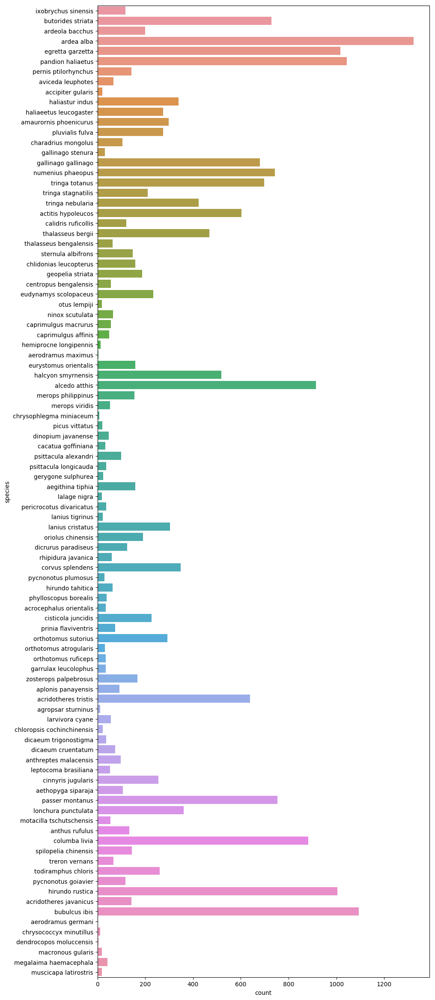

In [24]:
data = df['species'].value_counts()
my_dpi = 100
sns.utils.plt.figure(figsize=(1000/my_dpi, 3000/my_dpi), dpi=my_dpi)
sns.countplot(y=df['species'], orient='h')

## Cool visualization
The visualization above is pretty standard and straightforward: it immediately shows the distribution of the samples but it fails to deliver some other information, which could be included in a similar representation.

With this in mind and taking inspiration from the great works on the subreddit [r/dataisbeautiful](https://www.reddit.com/r/dataisbeautiful/), a *cooler* representation of this data was obtained using the module `PIL.Draw` and `matplotlib` to have more freedom of design.

The idea is to represent each sample in the dataseta as a single 10x10 square and put the samples representing the same species in a sequence, without any space, to create a filled area proportional to the number of samples. Additionally, the species belonging to the same species need to be clustered together. Lastly, a text must indicate the name of the family and of the species.

First of all, `matplotlib`'s `color` module was used to fit a colormap to our dataset, to the number of species available.

In [75]:
df_ordered_by_family = df.sort_values(['family', 'species'])
df_ordered_by_family.reset_index(inplace=True, drop=True)

species = list(df_ordered_by_family.species.unique())
species_count = df['species'].value_counts()
base = plt.cm.get_cmap('terrain')
cmap = base(np.linspace(0, 1, num= len(species)))
cmap *= 255
cmap = cmap.round()
cmap = cmap.astype(int)

The following code was used to deterimine the maximum length of the text, to use if as an offset for the rectangles in the image.

In [76]:
m = 0
im = Image.new('RGBA', (10, 10), color=(0, 0, 0))
draw = ImageDraw.Draw(im, 'RGBA')
for s in species:
    if draw.textsize(s)[0] > m:
        m = draw.textsize(s)[0]
print('Max length per species text: ', m)

m = 0
for s in df.family.unique():
    if draw.textsize(s)[0] > m:
        m = draw.textsize(s)[0]
print('Max length per family text: ', m)

Max length per species text:  156
Max length per family text:  84


The following code defines the function used to build the image. Between each species there is a color change and a small offset, whereas between different families there is a bigger gap and a straight line.

Of course, a big image was expected as an output. The shape `1499x3410` was a good compromise for a visully appealing representation. However, to read the text a zoom is still necessary.

[(760, 3394), (770, 3404)]


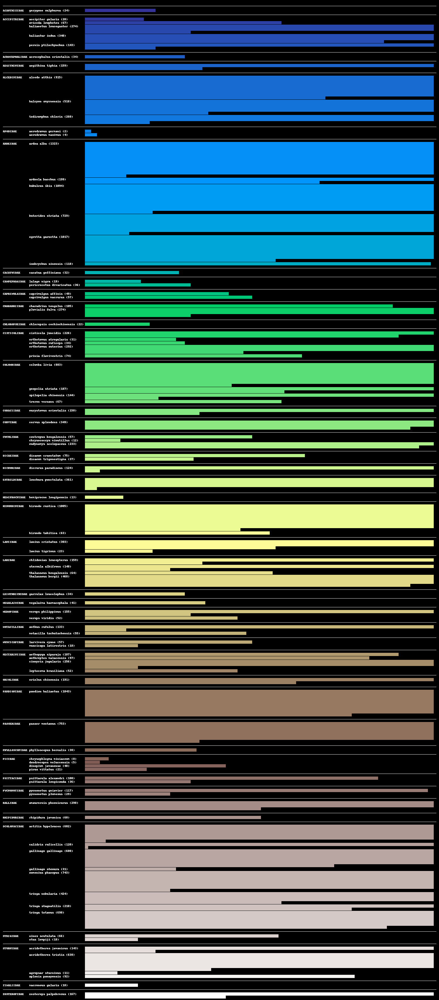

In [77]:
def drawVizDivideByFamily(df, imx = 2000, imy = 2000, x= 10, y =10):    
    im = Image.new('RGBA', (imx, imy), color=(0, 0, 0))
    draw = ImageDraw.Draw(im, 'RGBA')

    margin_x = 10
    margin_y = 10

    offset_x = 0
    offset_y = 0

    offset_x_newline_family = 90
    offset_x_newline_species = 190
    offset_x_newline = margin_x + offset_x_newline_family + offset_x_newline_species
    offset_x_species = 50
    offset_y_species = 2
    offset_y_family = 20

    r = c = 0
    MAX_EL_PER_ROW = (im.size[0] - offset_x) // (x+offset_x)
    MAX_EL_PER_COL = (im.size[1] - offset_y) // (y+offset_y)
    x0 = offset_x
    y0 = offset_y
    y1 = y0 + y

    x0 = 0
    y0 = 0
    y1 = y0 + y
    curr_species = ''
    curr_family = ''
    j=0

    for i in range(len(df)):        
        # go to newline if new family
        if df.loc[i, 'family'] != curr_family:
            #new parameters
            y0 = y1 + offset_y_family
            y1 = y0 + y
            x0 = offset_x_newline
            curr_family = df.loc[i, 'family']
            curr_species =df.loc[i, 'species']
            #insert text
            draw.text((margin_x, y0), curr_family.upper())
            draw.text((margin_x + offset_x_newline_family, y0), 
                      '{} ({})'.format(curr_species.lower(), species_count[curr_species]))

            #draw line
            draw.line([(margin_x, y0 - offset_y_family // 2), (imx - margin_x, y0 - offset_y_family // 2)], width=1)

        # add offset if new species in same family
        if df.loc[i, 'species'] != curr_species:
            y0 = y1 + offset_y_species
            y1 = y0 + y
            x0 = offset_x_newline
            curr_species = df.loc[i, 'species']
            draw.text((margin_x + offset_x_newline_family, y0), 
                     '{} ({})'.format(curr_species.lower(), species_count[curr_species]))

        x1 = x0 + x
        rect = [(x0, y0), (x1, y1)]    
        #print(rect)    

        draw.rectangle(rect, fill=tuple(cmap[species.index(df.loc[i, 'species'])]))

        #print(i+1, (i+1)%MAX_EL_PER_ROW, sep='\t')
        if x1 + offset_x + x >= imx-margin_x and i != 0:        
            r += 1
            y0 = y1 + offset_y
            y1 = y0 + y
            x0 = offset_x_newline
            #print(x1 + offset_x + x)
            #break
        else:
            x0 = x1 + offset_x

    print(rect)
    return im
    
with open('./visualization/perFamilyAlphab.png', 'wb') as f:
    im = drawVizDivideByFamily(df_ordered_by_family, imx = 1499, imy = 3410)
    im.save(f, format='png')
im

## Image tile visualization

Another idea for a visualization was to represent each species with a picture whose size is proportional to the number of samples in the dataset. The thumbnail images were manually selected and cropped to a square ratio. Their size is mapped to an interval between `rmax = 600` and `rmin = 200`. The size of the whole image is `3250x3250`.

To create a tile-like effect a recursive algorithm known as Binary Tree Bin Packing was implemented in its simplest version, taking inspiration by [this](https://codeincomplete.com/posts/bin-packing/) online article.

Each tile also includes text: on the top-left corner is the number of samples, on the bottom-right is the species scientific name. The length of the backround rectangles used for the text is dinamically generated.

In [78]:
gt_images_folder = './gt_images_sq/' # folder with the squared thumbnails used for the visualization

In [79]:
print('Most numerous family: ', df['family'].value_counts().max())
print('Least numerous family: ', df['family'].value_counts().min())
print('Most numerous species: ', df['species'].value_counts().max())
print('Least numerous species: ', df['species'].value_counts().min())

Most numerous family:  4480
Least numerous family:  6
Most numerous species:  1323
Least numerous species:  2


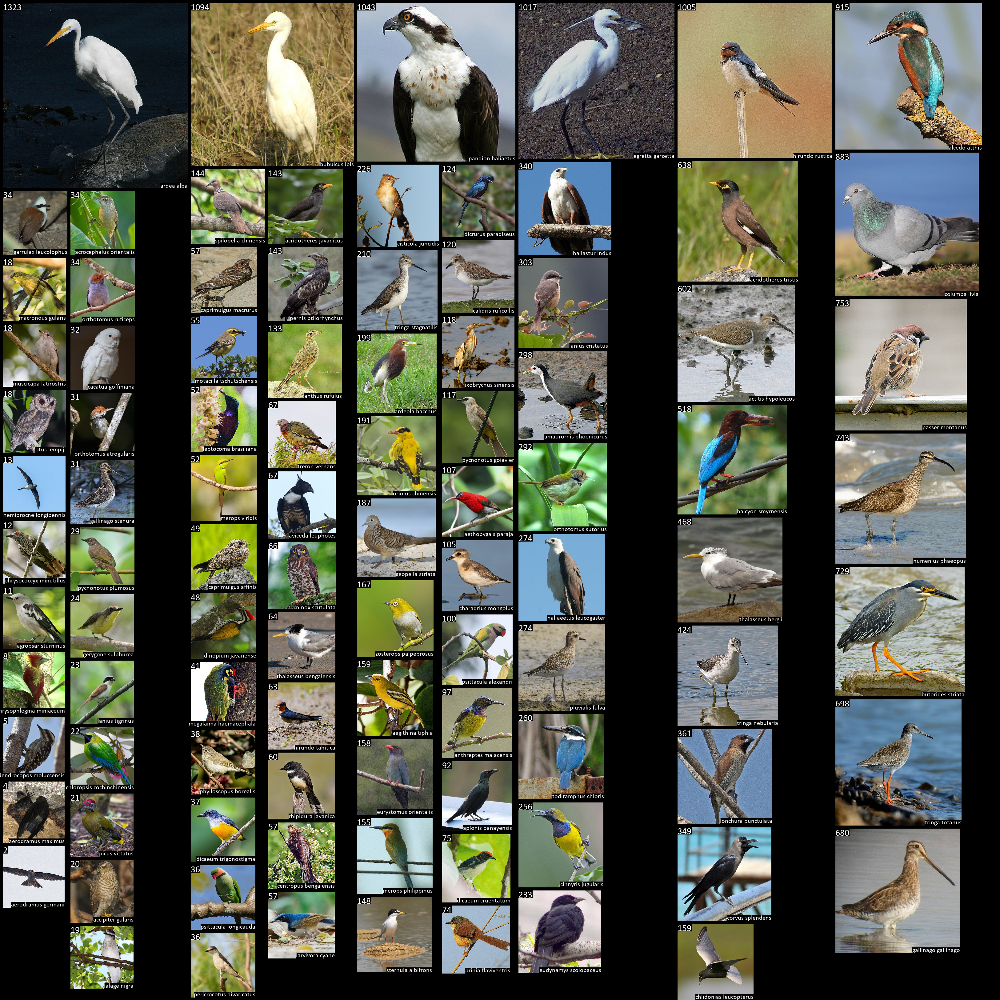

In [84]:
def rectToInt(rect):
    rect_new = []
    for coord in rect:
        coord_int = (int(np.round(coord[0])), int(np.round(coord[1])))
        rect_new.append(coord_int)
    return rect_new

def drawVizWithImages(df, rmax, rmin, imx = 1000, imy = 1000):       
    family_counts = df['family'].value_counts()
    
    #fmax = family_counts.max()
    #fmin = family_counts.min()
    
    fmax = df_species_count['species_count'].max()
    fmin = df_species_count['species_count'].min()
    
    margin_x = 10
    margin_y = 10

    offset_x = 10
    offset_y = 10

    r = c = 0
    
    x0 = margin_x
    y0 = margin_y
    
    curr_species = ''
    curr_family = ''
    
    class Entry():
        def __init__(self, key, l, n):
            self.key = key # species name
            self.l = l # length of thumbnail
            self.placed = False # placed?
            self.n = n # number of samples
            pass
        
        def __repr__(self):
            return('key: {}, length: {}'.format(self.key, self.l))
    
    class Node():
        def __init__(self, i, x0, y0, xlim, ylim, species_node = None):
            self.i = i
            self.l = l_list[i].l
            self.x0 = x0;
            self.y0 = y0;
            self.xlim = xlim
            self.ylim = ylim
            self.species_node = species_node
            self.inspect_node()
            
        def inspect_node(self):
            #print('Trying to place entry {}'.format(self.i))
            if (self.x0 + self.l <= self.xlim) and (self.y0 + self.l <= self.ylim) and (not l_list[self.i].placed):
                #place here
                rect = [(self.x0, self.y0), (self.x0  + self.l, self.y0 + self.l)]
                rect = rectToInt(rect)
                #print('Placing entry {} in (x0: {}, y0: {}, l: {})'.format(self.i, self.x0, self.y0, self.l))            
                #draw.rectangle(rect, fill = tuple(cmap[self.i]))
                #take random species from family
                family = l_list[self.i].key
                #species = choice(list(df_species_count.loc[family].index))
                species = family
                thumbnail = Image.open(gt_images_folder+species.lower().replace(' ', '_')+ '.jpg')
                thumbnail = thumbnail.resize((int(self.l), int(self.l)))
                im.paste(thumbnail, (rect[0][0], rect[0][1])) #paste thumbnail in big picture
                
                #add number text
                font = ImageFont.truetype('./visualization/calibri.ttf', 30)
                text = str(l_list[self.i].n)
                text_size = draw.textsize(text, font=font)
                draw.rectangle([(rect[0][0], rect[0][1]), (rect[0][0] + text_size[0], rect[0][1] + text_size[1])], fill = 'black')
                draw.text((rect[0][0], rect[0][1]), text, font = font)
                
                #add species text
                font = ImageFont.truetype('./visualization/calibri.ttf', 20)
                text = str(species)
                text_size = draw.textsize(text, font=font)
                text_rect = [(rect[1][0] - text_size[0], rect[1][1] - text_size[1]), (rect[1][0], rect[1][1])]
                draw.rectangle(text_rect, fill = 'black')
                draw.text((text_rect[0][0], text_rect[0][1]), text, font = font)                                
                
                thumbnail.close()
                
                #mark this node as assigned
                l_list[self.i].placed = True
                #create two new nodes
                if(self.i+1 < len(l_list)):                    
                    Node(self.i+1, self.x0 + self.l + offset_x, self.y0, self.xlim, self.ylim)                    
                    Node(self.i+1, self.x0, self.y0+self.l + offset_y, self.x0 + self.l, self.ylim)             
            else:
                if(self.i+1 < len(l_list)):
                    #try placing smaller
                    Node(self.i+1, self.x0, self.y0, self.xlim, self.ylim)
    
    ITER_MAX = 500
    var = 0.9
    ii = 0
        
    im = Image.new('RGB', (imx, imy), color=(0, 0, 0))
    draw = ImageDraw.Draw(im, 'RGB')

    previous_l = 0
    l_list = []
    for i, el in enumerate(df_species_count['species_count'].sort_values(ascending = False).items()):
        k, v = el
        k = k[1]
        l = np.floor((v-fmin)/(fmax - fmin) * (rmax - rmin) + rmin)
        #l = imx * np.sqrt(v/family_counts.sum())
        #l = imx/(2*i)
        #if(i==0):
        #    l = imx / 2;
        #else:
        #    l = previous_l * var
        l_list.append(Entry(k, l, v))        

    # squares loop

    Node(0, offset_x, offset_y, imx, imy)

    all_placed = True
    for l in l_list: 
        #print(l)
        if not l.placed:
            all_placed = False
            
    if not all_placed:
        print(all_placed)
    
    return im

rmax = 600
rmin = 200

imx = 3250
imy = imx
im = drawVizWithImages(df_new, rmax, rmin, imx = imx, imy = imy)
im.save('visualization/species_tile.png')
im

# Data Validation

Go back to [Table of Contents](#Table-of-Contents)

## Removing minority classes
The first step was to remove the families with a number of samples <200, which are considered unsuitable for the learning task. The implementation is straightforward.

In [111]:
threshold = 200
df = pd.read_csv('dataset_complete.csv')
families_count = df['family'].value_counts()
families_to_drop = list(families_count[families_count < threshold].index)

df_new = df[df['family'].apply(lambda x: x not in families_to_drop)]
df_new.sample(10)

# save to dataset_clean.csv
df = df_new.reset_index(drop=True)
df.to_csv('dataset_clean.csv', index=False)

## Web App

Go back to [Table of Contents](#Table-of-Contents)

Given that these pictures have been acquired from the web a validation phase was necessary to to get rid of low-quality, noisy and incorrectly labelled samples. Noisy samples include pictures with multiple birds, details or "artistic" shots that could confuse the Deep Learning algorithm. 
The following pictures illustrate some examples of this concept within the Great Egret (Ardea Alba) class.

![](./notebook_images/validation_examples.png)

However, manually labelling more thank 20k images could be a tedious task for a single person (especially those pursuing a PhD). That's why, instead of doing a long and boring task, the choice was to develop a whole application to label pictures and share it with other people to ask for help. 

A normal person would ask: is building a web-app (without any substancial experience on the matter) actually faster than simply labelling pictures? Probably not; however it was a chance to acquire useful skills for a data science project and build a re-usable platform for the future.

The code for a web application is not suitable for a `notebook` and its detailed description goes far beyond the scope of this notebook. Thus, the following sections will only give an overview of how the platform works, how to run it and the obtained output.

### Application features

The __home__ page of the application prompts the user to register a new account or login (if already registered). Having a personal account rather than free access allows to keep track of a user's progress, delete previous choices and have multiple inputs for the same images.

As soon a user logs in, he is shown the __About the App__ page, which gives information on how the application works and how to make choices while using it.

The core of the application is the __Label Images__ page.

![](./notebook_images/label_layout.PNG)

The user can select a species of its choice or a random species, extracted from the `species_dataset_onlycommon.csv`. This means that some species might not have any pictures. If this is the case, a message prompts the user to select a different species.

After choosing the species, the user is presented a random picture of that species extracted from `dataset_new.csv`. The interface shows a __Ground Truth__ thumbnail on the left to help in the decision. A dynamically generated link to the Wikipedia page of the species is also shown, so that the user can check details on the species or simply learn more about it.

Four buttons allow the user to classifiy the image as __Good__, __Bad__ or __Suggest Cropping__. If insecure, the user can choose to skip this image (which will be re-inserted in the pool, i.e. might be shown again). Labelling an image will remove it from the pool (i.e. it won't be shown again to this user).

The __Dashboard__ page allows the user to check its progress and reconsider some of his/her previous choices.

![](./notebook_images/app_dashboard.png)

The application generates a `.json` file for each user to keep track of its progress. This file will be later used to join the results of all the users and obtain a new version of the dataset.

#### Deployment
The app was left running on a computer in the lab and made accessible from within the NTU Network by running simple server using `gunicorn`. Friends and colleagues were _kindly_ invited to take part in the "game" and help us label these images, while learning about birds.

#### Technical
The app was built using Python3 and HTML. The app runs on the Python framework [Flask](http://flask.pocoo.org/). HTML-wise, [Bootstrap](https://getbootstrap.com/) was used to set its style and make it responsive.

### Running the app

The application is available in the `app` folder. The `venv` folder in it contains the Python3 virtual environment with all the libraries necessary to run it. Once the environment is running `python main.py` should be sufficient to run the application on `localhost:8080` and access it from any browser.

The application needs internet connection to display the pictures, as loading the whole dataset in the browser would have made it slow and heavy; thus, only the direct links to the images are stored.

__NOTE:__ the app is currently set to be accessible to any user connected to the same network. To make it accessible only from the machine it is running on, in `main.py` change 

```
if __name__ == '__main__':
        app.run(host='0.0.0.0', port=8080, debug=True)
```       

to

```
if __name__ == '__main__':
        app.run(host='127.0.0.1', port=8080, debug=True)
```

## Joining the results from the app

Go back to [Table of Contents](#Table-of-Contents)

Results from the application have been joined using the inputs from the user-generated .json files and applying the Majority Rule. In case of a tie between _Good_ and _Bad_, the *safe* choice is made, considering the image as Bad.

In [89]:
collections_path = './app_json/'
#files have been renamed to remove usernames
os.listdir(collections_path)

['001.json',
 '002.json',
 '003.json',
 '004.json',
 '005.json',
 '006.json',
 '007.json',
 '008.json',
 '009.json']

In [90]:
entries = {}

for filename in os.listdir(collections_path):
    if filename.endswith('.json'):
        with open(collections_path+filename) as f:
            collection = json.load(f)
            collection = collection['user']
            for key, value in collection.items():
                if key not in entries.keys():            
                    # create new list
                    entries[key] = {'V' : 0, 'X' : 0, 'C' : 0}            
                # add to collection
                entries[key][value['input']] += 1
            
entries    

{'7099583185-Ninox-scutulata': {'V': 0, 'X': 1, 'C': 0},
 'halcyon_smyrnensis_00069': {'V': 0, 'X': 1, 'C': 0},
 '3126735130-Halcyon-smyrnensis': {'V': 1, 'X': 0, 'C': 0},
 '6074802470-Thalasseus-bengalensis': {'V': 0, 'X': 1, 'C': 0},
 'thalasseus_bengalensis_00013': {'V': 1, 'X': 0, 'C': 0},
 '4101694734-Thalasseus-bengalensis': {'V': 0, 'X': 1, 'C': 0},
 '8723281178-Ninox-scutulata': {'V': 0, 'X': 0, 'C': 1},
 'halcyon_smyrnensis_00067': {'V': 0, 'X': 0, 'C': 1},
 '6809533946-Halcyon-smyrnensis': {'V': 1, 'X': 0, 'C': 0},
 '6862000948-Halcyon-smyrnensis': {'V': 1, 'X': 0, 'C': 0},
 'orthotomus_atrogularis_00008': {'V': 1, 'X': 0, 'C': 0},
 'thalasseus_bengalensis_00030': {'V': 0, 'X': 1, 'C': 0},
 'halcyon_smyrnensis_00266': {'V': 1, 'X': 0, 'C': 0},
 'halcyon_smyrnensis_00064': {'V': 1, 'X': 0, 'C': 0},
 '5040368752-Halcyon-smyrnensis': {'V': 1, 'X': 0, 'C': 0},
 'halcyon_smyrnensis_00191': {'V': 0, 'X': 0, 'C': 1},
 'orthotomus_atrogularis_00020': {'V': 0, 'X': 1, 'C': 0},
 '87233

In [91]:
entries_maj = {}

def majorityRule(inputs):    
    maj_input = ('SAMPLE', -99)
    for k in inputs.keys():
        if inputs[k] > maj_input[1]:
            maj_input = (k, inputs[k])
        elif inputs[k] == maj_input and k == 'X':
            maj_input = (k, inputs[k])
    return maj_input[0]

for sample, inputs in entries.items():
    if sample not in entries_maj.keys():
        entries_maj[sample] = ''    
    entries_maj[sample] = majorityRule(inputs)

entries_maj

{'7099583185-Ninox-scutulata': 'X',
 'halcyon_smyrnensis_00069': 'X',
 '3126735130-Halcyon-smyrnensis': 'V',
 '6074802470-Thalasseus-bengalensis': 'X',
 'thalasseus_bengalensis_00013': 'V',
 '4101694734-Thalasseus-bengalensis': 'X',
 '8723281178-Ninox-scutulata': 'C',
 'halcyon_smyrnensis_00067': 'C',
 '6809533946-Halcyon-smyrnensis': 'V',
 '6862000948-Halcyon-smyrnensis': 'V',
 'orthotomus_atrogularis_00008': 'V',
 'thalasseus_bengalensis_00030': 'X',
 'halcyon_smyrnensis_00266': 'V',
 'halcyon_smyrnensis_00064': 'V',
 '5040368752-Halcyon-smyrnensis': 'V',
 'halcyon_smyrnensis_00191': 'C',
 'orthotomus_atrogularis_00020': 'X',
 '8723307816-Ninox-scutulata': 'X',
 '8749547391-Ninox-scutulata': 'V',
 'thalasseus_bengalensis_00025': 'C',
 'ninox_scutulata_00000': 'C',
 'thalasseus_bengalensis_00009': 'C',
 'thalasseus_bengalensis_00031': 'X',
 '5799718959-Thalasseus-bengalensis': 'X',
 '6921500314-Halcyon-smyrnensis': 'V',
 '7980626044-Halcyon-smyrnensis': 'X',
 'orthotomus_atrogularis_0

In [92]:
pd.DataFrame.from_dict(entries_maj, orient='index')[0].value_counts()

V    902
X    308
C     73
Name: 0, dtype: int64

In [6]:
df = pd.read_csv('dataset_clean.csv', index_col='id')
print('Current size: {} samples'.format(len(df)))
df.sample(10)

Current size: 19524 samples


,species,source,url,common_name,scientific_name,abundance,status,family,notes
id,,,,,,,,,
tringa_nebularia_00120,tringa nebularia,ibc,https://www.hbw.com/sites/default/files/styles...,Common Greenshank,tringa nebularia,C,WV,Scolopacidae,-
6110205865-Tringa-nebularia,tringa nebularia,flickr,http://farm7.staticflickr.com/6073/6110205865_...,Common Greenshank,tringa nebularia,C,WV,Scolopacidae,-
halcyon_smyrnensis_00182,halcyon smyrnensis,ibc,https://www.hbw.com/sites/default/files/styles...,White-throated Kingfisher,halcyon smyrnensis,C,RB,Alcedinidae,-
5979723730-Orthotomus-sutorius,orthotomus sutorius,flickr,http://farm7.staticflickr.com/6013/5979723730_...,Common Tailorbird,orthotomus sutorius,C,RB,Cisticolidae,-
butorides_striata_00364,butorides striata,ibc,https://www.hbw.com/sites/default/files/styles...,Striated Heron,butorides striata,C,RB WV,Ardeidae,-
17057775567-Acridotheres-javanicus,acridotheres javanicus,flickr,http://farm9.staticflickr.com/8802/17057775567...,Javan Myna,acridotheres javanicus,A,IRB,Sturnidae,**
egretta_garzetta_00486,egretta garzetta,ibc,https://www.hbw.com/sites/default/files/styles...,Little Egret,egretta garzetta,C,WV,Ardeidae,-
6999377592-Columba-livia,columba livia,flickr,http://farm8.staticflickr.com/7228/6999377592_...,Rock Dove,columba livia,A,IRB,Columbidae,-
4535503924-Ardea-alba,ardea alba,flickr,http://farm3.staticflickr.com/2744/4535503924_...,Great Egret,ardea alba,C,WV,Ardeidae,-


The output of the majority rule has been applied to the latest verion of the dataset by removing the images labelled as Bad (__X__).

In [97]:
for key, value in entries_maj.items():
    if value == 'X':
        if key in list(df.index):
            df.drop(key, inplace=True)
print('Current size: {} samples'.format(len(df)))

Current size: 19524 samples


In [114]:
df = df.reset_index()
df.to_csv('dataset_clean.csv', index=False)

This (`df_clean.csv`) is the most updated version of the dataset.

# Classification

Go back to [Table of Contents](#Table-of-Contents)

## Loading dataset

We split the dataset into training and testing sets with a ratio of 0.8:0.2. For each species, the first 80% will be taken as the training set while the remaining 20% will be taken as the testing set.

In [3]:
# random seed 
np.random.seed(1)

# List all data folders for the raw images
data_folders = [f for f in os.scandir('data') if f.is_dir()]
nspecies = len(data_folders)

train_ratio = 0.8

train_paths = []
train_ids = []

test_paths = []
test_ids = []

# Create dataframes that can be used directly by Keras ImageDataGenerator class
for i in range(nspecies):
    image_list = glob(data_folders[i].path + "/*.jpg")

    # Splitting the datasets to training and testing
    train_idx = math.floor(len(image_list)*train_ratio)
    for j in range(train_idx):
        train_paths.append(image_list[j][5:])
        filename_idx = image_list[j].find('/',5)
        if filename_idx == -1:
            filename_idx = image_list[j].find('\\',5)
        train_ids.append(image_list[j][filename_idx+1:-4])
    for j in range(train_idx,len(image_list)):
        test_paths.append(image_list[j][5:])
        filename_idx = image_list[j].find('/',5)
        if filename_idx == -1:
            filename_idx = image_list[j].find('\\',5)
        test_ids.append(image_list[j][filename_idx+1:-4])
train_set = pd.DataFrame({'paths':train_paths, 'id':train_ids})
test_set = pd.DataFrame({'paths':test_paths, 'id':test_ids})

# The clean dataset is obtained by manual cleaning
dataset_clean = pd.read_csv('dataset_clean.csv')

train_set = pd.merge(train_set, dataset_clean, how='inner', on=['id'])
test_set = pd.merge(test_set, dataset_clean, how='inner', on=['id'])
train_set = train_set.sort_values(['family','species'])
test_set = test_set.sort_values(['family','species'])

We look at the distribution of the dataset corresponding to the bird family and species.

In [4]:
all_species = train_set.species.unique()
all_family = train_set.family.unique()

# First we list the amount of training and testing images corresponding to each family
family_train_distribution = train_set.groupby(['family'], as_index=False).count()
family_train_distribution.drop(family_train_distribution.columns.difference(['family','paths']), 1, inplace=True)
family_train_distribution.columns=['family', '# Train Images']

family_test_distribution = test_set.groupby(['family'], as_index=False).count()
family_test_distribution.drop(family_test_distribution.columns.difference(['family','paths']), 1, inplace=True)
family_test_distribution.columns=['family', '# Test Images']

family_info = pd.merge(family_train_distribution,family_test_distribution)

# Next we list the amount of training and testing images corresponding to each species
train_distribution = train_set.groupby(['species'], as_index=False).count()
train_distribution.drop(train_distribution.columns.difference(['species','paths']), 1, inplace=True)
train_distribution.columns=['species', '# Train Images']

test_distribution = test_set.groupby(['species'], as_index=False).count()
test_distribution.drop(test_distribution.columns.difference(['species','paths']), 1, inplace=True)
test_distribution.columns=['species', '# Test Images']

species_info = pd.merge(train_distribution,test_distribution)

def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

display_side_by_side(family_info, species_info)

,family,# Train Images,# Test Images
0,Accipitridae,584,147
1,Alcedinidae,1334,334
2,Ardeidae,3528,888
3,Charadriidae,303,76
4,Cisticolidae,519,131
5,Columbidae,1023,258
6,Corvidae,279,70
7,Cuculidae,233,59
8,Estrildidae,288,73
9,Hirundinidae,851,214


We can visualize all images belonging to a specific family or species below.

## Our Proposed Classification Pipeline

Feature extraction will be done using VGG16 / ResNet50 network pretrained on ImageNet.

Following feature extraction, we then train our network for classification over the bird **families**. 

For this task, we compare two loss functions:
-  Softmax entropy loss which is commonly used in classification tasks.
-  Triplet loss (an example of a loss function from the metric learning loss class).

## Classification with Softmax Cross Entropy Loss

Go back to [Table of Contents](#Table-of-Contents)

In the following, we employ the Keras preprocessing framework to read in the training and testing datasets defined via the dataframes above. Keras also allows us to perform data augmentation efficiently.

In [6]:
# Some hyperparameters
image_size = 224
batch_size = 32


# Patch the dataframe filenames interaction in Keras preprocessing
def patched_list_filenames(directory, white_list_formats, split,
                                       class_indices, follow_links, df=False):
    dirname = os.path.basename(directory)
    if split:
        num_files = len(list(
            _iter_valid_files(directory, white_list_formats, follow_links)))
        start, stop = int(split[0] * num_files), int(split[1] * num_files)
        valid_files = list(
            _iter_valid_files(
                directory, white_list_formats, follow_links))[start: stop]
    else:
        valid_files = _iter_valid_files(
            directory, white_list_formats, follow_links)
    if df:
        filenames = []
        for root, fname in valid_files:
            absolute_path = os.path.join(root, fname)
            relative_path = os.path.relpath(absolute_path, directory)
            filenames.append(relative_path)
        return filenames
    classes = []
    filenames = []
    for root, fname in valid_files:
        classes.append(class_indices[dirname])
        absolute_path = os.path.join(root, fname)
        relative_path = os.path.join(
            dirname, os.path.relpath(absolute_path, directory))
        filenames.append(relative_path)
    return classes, filenames

keras_preprocessing.image._list_valid_filenames_in_directory.__code__ = patched_list_filenames.__code__


# Adaptive histogram equalization incorporated as preprocessing
def AHE(img):
    img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)
    return img_adapteq


# Train set generation and augmentation using Keras preprocessing
# Augmentation=True
softmax_train_gen = ImageDataGenerator(
            rotation_range=20,
            width_shift_range=0.3,
            height_shift_range=0.3,
            shear_range=0,
            zoom_range=0.3,
            horizontal_flip=True,
            fill_mode='nearest',
#           preprocessing_function = contrast_adjusment,
#           preprocessing_function = HE,
#           preprocessing_function = AHE
            )
                                   
softmax_train_gen = softmax_train_gen.flow_from_dataframe(
    dataframe=train_set, 
    #dataframe= Selected_samples,
    directory='./data',
    x_col='paths', 
    y_col='family', 
    has_ext=True,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode='categorical')

# Test set generation using Keras preprocessing
softmax_test_gen = ImageDataGenerator()
softmax_test_gen = softmax_test_gen.flow_from_dataframe(
    dataframe=test_set, 
    directory="./data/", 
    x_col="paths", 
    y_col="family", 
    has_ext=True,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode='categorical')

num_classes = len(softmax_train_gen.class_indices)

Found 15594 images belonging to 19 classes.
Found 3930 images belonging to 19 classes.


We look at two pretrained networks: VGG16 and ResNet50. 

In [7]:
# Define the softmax cross entropy loss model
def SoftmaxModel(network):
    if network == 'ResNet':
        base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')
    elif network == 'VGG16':
        base_model = VGG16(weights='imagenet', include_top=False, pooling='avg')
    for layer in base_model.layers:
        layer.trainable = False
    
    x = base_model.output
    x = Dense(1024, activation='relu')(x)
    x = Dense(256, activation='relu')(x)
    x = Dense(num_classes, activation='softmax')(x)
    softmax_model = Model(inputs=base_model.input, outputs=x)
    
    return softmax_model

The following defines a model with ResNet50 as the base CNN.

In [15]:
resnet_softmax = SoftmaxModel('ResNet')

# 150 or 175
for layer in resnet_softmax.layers[:150]:
    layer.trainable = False

# Training the softmax model
resnet_softmax.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist_resnet_softmax = resnet_softmax.fit_generator(generator=softmax_train_gen,
                                                   steps_per_epoch=int(train_set.shape[0]//batch_size),
                                                   epochs=10,
                                                   shuffle=True,
                                                   validation_data=softmax_test_gen,
                                                   validation_steps=int(test_set.shape[0]//batch_size),
                                                   verbose=2)

Epoch 1/10
 - 610s - loss: 1.3153 - acc: 0.6018 - val_loss: 1.2357 - val_acc: 0.6552
Epoch 2/10
 - 280s - loss: 0.9667 - acc: 0.6963 - val_loss: 1.1618 - val_acc: 0.6778
Epoch 3/10
 - 265s - loss: 0.8632 - acc: 0.7279 - val_loss: 1.1200 - val_acc: 0.6990
Epoch 4/10
 - 265s - loss: 0.7989 - acc: 0.7476 - val_loss: 1.1340 - val_acc: 0.6844
Epoch 5/10
 - 258s - loss: 0.7509 - acc: 0.7657 - val_loss: 1.1598 - val_acc: 0.6883
Epoch 6/10
 - 256s - loss: 0.7072 - acc: 0.7729 - val_loss: 1.1988 - val_acc: 0.6995
Epoch 7/10
 - 258s - loss: 0.6776 - acc: 0.7869 - val_loss: 1.3675 - val_acc: 0.6770
Epoch 8/10
 - 264s - loss: 0.6543 - acc: 0.7911 - val_loss: 1.1049 - val_acc: 0.7093
Epoch 9/10
 - 254s - loss: 0.6258 - acc: 0.8012 - val_loss: 1.0860 - val_acc: 0.7193
Epoch 10/10
 - 255s - loss: 0.5884 - acc: 0.8125 - val_loss: 1.2390 - val_acc: 0.6975


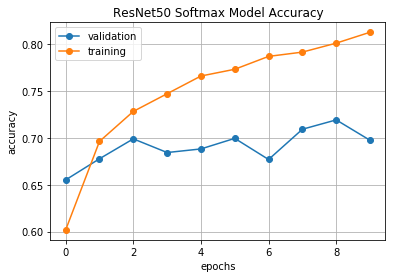

In [16]:
plt.plot(hist_resnet_softmax.epoch,hist_resnet_softmax.history['val_acc'],'-o',label='validation')
plt.plot(hist_resnet_softmax.epoch,hist_resnet_softmax.history['acc'],'-o',label='training')

plt.legend(loc=0)
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.title('ResNet50 Softmax Model Accuracy')
plt.grid(True)

In [8]:
vgg_softmax = SoftmaxModel('VGG16')

for layer in vgg_softmax.layers[:19]:
    layer.trainable = False

# Training the softmax model
vgg_softmax.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist_vgg_softmax = vgg_softmax.fit_generator(generator=softmax_train_gen,
                                             steps_per_epoch=int(train_set.shape[0]//batch_size),
                                             epochs=15,
                                             shuffle=True,
                                             validation_data=softmax_test_gen,
                                             validation_steps=int(test_set.shape[0]//batch_size),
                                             verbose=2)



Epoch 1/15
 - 267s - loss: 1.5156 - acc: 0.5647 - val_loss: 0.9889 - val_acc: 0.7103
Epoch 2/15
 - 265s - loss: 1.0822 - acc: 0.6663 - val_loss: 1.0402 - val_acc: 0.6988
Epoch 3/15
 - 263s - loss: 0.9820 - acc: 0.6970 - val_loss: 0.8953 - val_acc: 0.7340
Epoch 4/15
 - 261s - loss: 0.9115 - acc: 0.7154 - val_loss: 0.8193 - val_acc: 0.7550
Epoch 5/15
 - 262s - loss: 0.8674 - acc: 0.7262 - val_loss: 0.8786 - val_acc: 0.7653
Epoch 6/15
 - 277s - loss: 0.8209 - acc: 0.7411 - val_loss: 0.8551 - val_acc: 0.7655
Epoch 7/15
 - 264s - loss: 0.7808 - acc: 0.7555 - val_loss: 0.8582 - val_acc: 0.7763
Epoch 8/15
 - 262s - loss: 0.7505 - acc: 0.7605 - val_loss: 0.9718 - val_acc: 0.7545
Epoch 9/15
 - 262s - loss: 0.7251 - acc: 0.7668 - val_loss: 0.9086 - val_acc: 0.7583
Epoch 10/15
 - 264s - loss: 0.6956 - acc: 0.7804 - val_loss: 0.8683 - val_acc: 0.7658
Epoch 11/15
 - 263s - loss: 0.6762 - acc: 0.7841 - val_loss: 0.9579 - val_acc: 0.7707
Epoch 12/15
 - 273s - loss: 0.6578 - acc: 0.7865 - val_loss: 0.

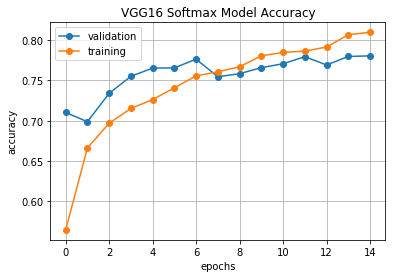

In [9]:
plt.plot(hist_vgg_softmax.epoch,hist_vgg_softmax.history['val_acc'],'-o',label='validation')
plt.plot(hist_vgg_softmax.epoch,hist_vgg_softmax.history['acc'],'-o',label='training')

plt.legend(loc=0)
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.title('VGG16 Softmax Model Accuracy')
plt.grid(True)

## Evaluating on Test Images for Softmax Cross Entropy Loss

We evaluate on test images and display the results using a confusion matrix and precision/recall/f1-scores.

In [ ]:
resnet_softmax_pred = []
vgg_softmax_pred = []
ground_truth = []


# Read in all images belonging to a family
def read_images(family, trainortest):
    if trainortest == 'train':
        paths = train_set['paths'][train_set['family']==family].tolist()
    elif trainortest == 'test':
        paths = test_set['paths'][test_set['family']==family].tolist()
    paths = ['./data/' + s for s in paths]
    imgs = [load_img(img_path, target_size=(image_size, image_size)) for img_path in paths]
    img_array = np.array([img_to_array(img) for img in imgs])
    return img_array


for i in all_family:
    resnet_softmax_pred.append(resnet_softmax.predict(preprocess_input(read_images(i, 'test'))))
    vgg_softmax_pred.append(vgg_softmax.predict(vgg_preprocess_input(read_images(i, 'test'))))
    n_test_imgs = family_info['# Test Images'][family_info.family==i].iloc[0]
    for j in range(n_test_imgs):
        ground_truth.append(i)

    
resnet_softmax_pred = np.vstack(resnet_softmax_pred)
np.savetxt("resnet_softmax.csv", resnet_softmax_pred, delimiter=",")
resnet_softmax_pred = np.argmax(resnet_softmax_pred, axis=1).tolist()

vgg_softmax_pred = np.vstack(vgg_softmax_pred)
np.savetxt("vgg_softmax.csv", vgg_softmax_pred, delimiter=",")
vgg_softmax_pred = np.argmax(vgg_softmax_pred, axis=1).tolist()

ground_truth = np.hstack(ground_truth)

for i in range(len(ground_truth)):
    resnet_softmax_pred[i] = all_family[resnet_softmax_pred[i]]
    vgg_softmax_pred[i] = all_family[vgg_softmax_pred[i]]

In [22]:
def normalize_CM(cm):
    total_counts = cm.sum(axis=1)
    normalized = np.copy(cm.astype(float))
    for i in range(len(total_counts)):
        normalized[i] = cm[i].astype(float)/total_counts[i]
    return normalized


def plot_confusion_matrix(cm, title='Confusion matrix', cmap=plt.cm.Blues):

    plt.figure(figsize=(20,20))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=30)
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=16) 


    plt.ylabel('True label', fontsize=20)
    plt.xlabel('Predicted label', fontsize=20)
    plt.tight_layout()
    
    plt.tick_params(
    axis='both',
    which='both',      
    bottom=False, 
    left=False,
    labelbottom=False,
    labelleft=False)
    
    thresh = cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if i==j:
            plt.text(j, i, format(cm[i, j], '.2f'), horizontalalignment="center", fontsize=16, 
                     color="white" if cm[i, j] > thresh else "black")


print('ResNet50 Softmax cross entropy loss Confusion Matrix')
resnet_softmax_CM = np.genfromtxt('resnet_softmax_CM.csv', delimiter=',')
#resnet_softmax_CM = confusion_matrix(ground_truth, resnet_softmax_pred)
print(resnet_softmax_CM)
resnet_softmax_CM_normalized = normalize_CM(resnet_softmax_CM)
plot_confusion_matrix(resnet_softmax_CM_normalized, 'Normalized Confusion Matrix for Softmax Classification with ResNet50')
print('ResNet50 Softmax cross entropy loss Classification Report')
resnet_softmax_CR = classification_report(ground_truth, resnet_softmax_pred)
print(resnet_softmax_CR)


print('VGG16 Softmax cross entropy loss Confusion Matrix')
#vgg_softmax_CM = confusion_matrix(ground_truth, vgg_softmax_pred)
vgg_softmax_CM = np.genfromtxt('vgg_softmax_CM.csv', delimiter=',')
print(vgg_softmax_CM)
vgg_softmax_CM_normalized = normalize_CM(vgg_softmax_CM)
plot_confusion_matrix(vgg_softmax_CM_normalized, 'Normalized Confusion Matrix for Softmax Classification with VGG16')

print('VGG16 Softmax cross entropy loss Classification Report')
vgg_softmax_CR = classification_report(ground_truth, vgg_softmax_pred)
print(vgg_softmax_CR)

ResNet50 Softmax cross entropy loss Confusion Matrix
[[ 94   0   3   0   0   0   0   0   1   8   3   6   1   0  23   0   0   4
    4]
 [  3 103  17   0   4   1   1   2   1  33  13   3  59  79   1   0   0  11
    3]
 [  0   2 827   0   2   0   0   0   0   4   3  11   0   0   3   0   0  35
    1]
 [  0   0   2  28   0   1   0   0   0   0   0   6   0   0   0   0   1  38
    0]
 [  0   2  10   0  58   0   0   0   3  20  17   2   3   8   0   2   0   5
    1]
 [  5   3  20  10   2 120   1   0  14   3   3  23   1   2   9   9   0  24
    9]
 [  4   0   8   1   0   1   7   0   0   4   4   9   0   0   2   1   3   2
   24]
 [  5   0   0   0   1   0   1  26   5   1   0   0   0   2   1   0   0   0
   17]
 [  0   0   6   0   4   1   0   0  25  16   6   0   0   1   0   1   1   4
    8]
 [  1   4   3   1   7   0   1   1   5 146   6   8   0   4   2  10   0  14
    1]
 [  0   3   7   0   3   0   0   0   1   5  44   1   1   0   0   1   0   0
    0]
 [  0   0   7   2   0   0   0   0   0   0   0 131   0   

## Classification with Triplet Loss

Go back to [Table of Contents](#Table-of-Contents)

The triplet loss is an example of a metric learning loss.

From the training set, triplets are sampled. Each triplet consists of an **anchor** sample, a **positive** sample (similar to the anchor) and a **negative** sample (different from the anchor).

A base CNN is used to extracted features from the triplet. The goal is to learn a metric function that maps from the base feature vector to a target embedding vector such that the intra-class distances while maximizing inter-class distances (typically L2 distance).

The following code implements the sample generator for the triplet loss.

In [15]:
# Some hyperparameters
image_size = 224
batch_size = 32
embedding_dim = 50


class sample_gen(object):
    def __init__(self, file_class_mapping):
        self.file_class_mapping= file_class_mapping
        self.class_to_list_files = defaultdict(list)
        self.list_all_files = list(file_class_mapping.keys())
        self.range_all_files = list(range(len(self.list_all_files)))

        for file, class_ in file_class_mapping.items():
            self.class_to_list_files[class_].append(file)

        self.list_classes = list(set(self.file_class_mapping.values()))
        self.range_list_classes= range(len(self.list_classes))
        self.class_weight = np.array([len(self.class_to_list_files[class_]) for class_ in self.list_classes])
        self.class_weight = self.class_weight/np.sum(self.class_weight)

    def get_sample(self):
        class_idx = np.random.choice(self.range_list_classes, 1, p=self.class_weight)[0]
        examples_class_idx = np.random.choice(range(len(self.class_to_list_files[self.list_classes[class_idx]])), 2)
        anchor_example, positive_example = self.class_to_list_files[self.list_classes[class_idx]][examples_class_idx[0]], self.class_to_list_files[self.list_classes[class_idx]][examples_class_idx[1]]

        negative_example = None
        while negative_example is None or self.file_class_mapping[negative_example] == self.file_class_mapping[anchor_example]:
            negative_example_idx = np.random.choice(self.range_all_files, 1)[0]
            negative_example = self.list_all_files[negative_example_idx]
        return anchor_example, positive_example, negative_example

    
def read_single_image(img_path):
    img = load_img('./data/' + img_path, target_size=(image_size, image_size))
    img_array = np.array(img_to_array(img))
    return img_array


def gen(triplet_gen, network):
    while True:
        list_anchor = []
        list_negative = []
        list_positive = []

        for i in range(batch_size):
            path_anchor, path_positive, path_negative = triplet_gen.get_sample()
            
            anchor = read_single_image(path_anchor)
            positive = read_single_image(path_positive)
            negative = read_single_image(path_negative)

            list_anchor.append(anchor)
            list_positive.append(positive)
            list_negative.append(negative)
        
        if network == 'ResNet':
            A = preprocess_input(np.array(list_anchor))
            P = preprocess_input(np.array(list_positive))
            N = preprocess_input(np.array(list_negative))
        elif network == 'VGG16':
            A = vgg_preprocess_input(np.array(list_anchor))
            P = vgg_preprocess_input(np.array(list_positive))
            N = vgg_preprocess_input(np.array(list_negative))
        
        yield ({'anchor_input': A, 'positive_input': P, 'negative_input': N}, None)
        

train_paths = {img_path: family for img_path, family in zip(train_set.paths, train_set.family)}
train_paths = sample_gen(train_paths)

test_paths = {img_path: family for img_path, family in zip(test_set.paths, test_set.family)}
test_paths = sample_gen(test_paths)

Next, we define the triplet loss and our model. The embedding model maps the base feature from the CNN to an embedding vector. The triplet loss has the objective of maximizing distances from embedding vectors of different classes while minimizing distances from embedding vectors of similar classes.

In [6]:
def triplet_loss(inputs, dist='sqeuclidean', margin='maxplus'):
    anchor, positive, negative = inputs
    positive_distance = K.square(anchor - positive)
    negative_distance = K.square(anchor - negative)
    if dist == 'euclidean':
        positive_distance = K.sqrt(K.sum(positive_distance, axis=-1, keepdims=True))
        negative_distance = K.sqrt(K.sum(negative_distance, axis=-1, keepdims=True))
    elif dist == 'sqeuclidean':
        positive_distance = K.sum(positive_distance, axis=-1, keepdims=True)
        negative_distance = K.sum(negative_distance, axis=-1, keepdims=True)
    loss = positive_distance - negative_distance
    if margin == 'maxplus':
        loss = K.maximum(0.0, 1 + loss)
    elif margin == 'softplus':
        loss = K.log(1 + K.exp(loss))
    return K.mean(loss)


# Define the embedding model with the triplet loss
def TripletModel(network):
    if network == 'ResNet':
        base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')
    elif network == 'VGG16':
        base_model = VGG16(weights='imagenet', include_top=False, pooling='avg')
    for layer in base_model.layers:
        layer.trainable = False
    
    x = base_model.output
    x = Dense(256, activation='relu')(x)
    # x = Dropout(0.6)(x)
    x = Dense(embedding_dim)(x)
    x = Lambda(lambda  x: K.l2_normalize(x,axis=1))(x)
    embedding_model = Model(base_model.input, x, name="embedding")

    input_shape = (image_size, image_size, 3)
    anchor_input = Input(input_shape, name='anchor_input')
    positive_input = Input(input_shape, name='positive_input')
    negative_input = Input(input_shape, name='negative_input')
    anchor_embedding = embedding_model(anchor_input)
    positive_embedding = embedding_model(positive_input)
    negative_embedding = embedding_model(negative_input)

    inputs = [anchor_input, positive_input, negative_input]
    outputs = [anchor_embedding, positive_embedding, negative_embedding]
       
    triplet_model = Model(inputs, outputs)
    triplet_model.add_loss(K.mean(triplet_loss(outputs)))

    return embedding_model, triplet_model

In [16]:
resnet_embedding, resnet_triplet = TripletModel('ResNet')

resnet_triplet_train_gen = gen(train_paths, 'ResNet')
resnet_triplet_test_gen = gen(test_paths, 'ResNet')

# Training the ResNet triplet model
resnet_triplet.compile(loss=None, optimizer='adam')
hist_resnet_triplet = resnet_triplet.fit_generator(resnet_triplet_train_gen,
                                                   epochs=8,
                                                   steps_per_epoch=train_set.shape[0]//batch_size,
                                                   validation_data=resnet_triplet_test_gen,
                                                   validation_steps=test_set.shape[0]//batch_size,
                                                   verbose=2)

Epoch 1/8
 - 466s - loss: 0.3544 - val_loss: 0.2455
Epoch 2/8
 - 455s - loss: 0.2499 - val_loss: 0.2500
Epoch 3/8
 - 452s - loss: 0.2163 - val_loss: 0.2091
Epoch 4/8
 - 454s - loss: 0.1943 - val_loss: 0.2067
Epoch 5/8
 - 452s - loss: 0.1709 - val_loss: 0.1894
Epoch 6/8
 - 453s - loss: 0.1594 - val_loss: 0.1821
Epoch 7/8
 - 457s - loss: 0.1407 - val_loss: 0.1801
Epoch 8/8
 - 457s - loss: 0.1293 - val_loss: 0.1858


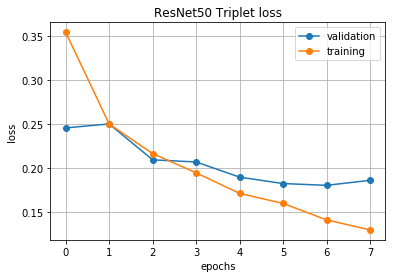

In [18]:
plt.plot(hist_resnet_triplet.epoch,hist_resnet_triplet.history['val_loss'],'-o',label='validation')
plt.plot(hist_resnet_triplet.epoch,hist_resnet_triplet.history['loss'],'-o',label='training')

plt.legend(loc=0)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.title('ResNet50 Triplet loss')
plt.grid(True)

In [7]:
vgg_embedding, vgg_triplet = TripletModel('VGG16')

vgg_triplet_train_gen = gen(train_paths, 'VGG16')
vgg_triplet_test_gen = gen(test_paths, 'VGG16')

# Training the VGG16 triplet model
vgg_triplet.compile(loss=None, optimizer='adam')
hist_vgg_triplet = vgg_triplet.fit_generator(vgg_triplet_train_gen,
                                                   epochs=8,
                                                   steps_per_epoch=train_set.shape[0]//batch_size,
                                                   validation_data=vgg_triplet_test_gen,
                                                   validation_steps=test_set.shape[0]//batch_size,
                                                   verbose=2)

Epoch 1/8
 - 427s - loss: 0.3317 - val_loss: 0.2370
Epoch 2/8
 - 406s - loss: 0.2217 - val_loss: 0.1994
Epoch 3/8
 - 404s - loss: 0.1685 - val_loss: 0.1967
Epoch 4/8
 - 405s - loss: 0.1448 - val_loss: 0.1757
Epoch 5/8
 - 408s - loss: 0.1342 - val_loss: 0.1790
Epoch 6/8
 - 409s - loss: 0.1114 - val_loss: 0.1798
Epoch 7/8
 - 404s - loss: 0.1002 - val_loss: 0.1854
Epoch 8/8
 - 406s - loss: 0.0861 - val_loss: 0.1696


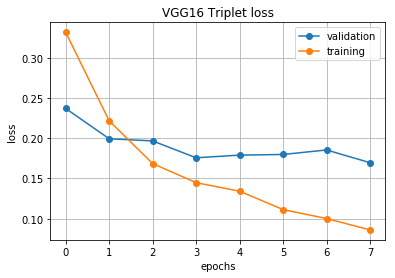

In [8]:
plt.plot(hist_vgg_triplet.epoch,hist_vgg_triplet.history['val_loss'],'-o',label='validation')
plt.plot(hist_vgg_triplet.epoch,hist_vgg_triplet.history['loss'],'-o',label='training')

plt.legend(loc=0)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.title('VGG16 Triplet loss')
plt.grid(True)

## Evaluating on Test Images for Triplet Loss

We first map all training and testing images to their respective embedding feature vectors using our embedding model. Once the embedding is done, classification is performed using *k*-NN.

Given a test image, we look for its *k* nearest neighbours in this embedding feature space. The largest neighbour labels count will correspond to the predicted label of this image.

In [19]:
# Read in all images belonging to a family
def read_images(family, trainortest):
    if trainortest == 'train':
        paths = train_set['paths'][train_set['family']==family].tolist()
    elif trainortest == 'test':
        paths = test_set['paths'][test_set['family']==family].tolist()
    paths = ['./data/' + s for s in paths]
    imgs = [load_img(img_path, target_size=(image_size, image_size)) for img_path in paths]
    img_array = np.array([img_to_array(img) for img in imgs])
    return img_array


resnet_train_features = []
vgg_train_features = []
for i in all_family:
    imgs = read_images(i, 'train')
    resnet_train_features.append(resnet_embedding.predict(preprocess_input(imgs)))
    vgg_train_features.append(vgg_embedding.predict(vgg_preprocess_input(imgs)))
    
resnet_train_features = np.vstack(resnet_train_features)
np.savetxt("resnet_train_features.csv", resnet_train_features, delimiter=",")
vgg_train_features = np.vstack(vgg_train_features)
np.savetxt("vgg_train_features.csv", vgg_train_features, delimiter=",")


resnet_test_features = []
vgg_test_features = []
for i in all_family:
    imgs = read_images(i, 'test')
    resnet_test_features.append(resnet_embedding.predict(preprocess_input(imgs)))
    vgg_test_features.append(vgg_embedding.predict(vgg_preprocess_input(imgs)))

resnet_test_features = np.vstack(resnet_test_features)
np.savetxt("resnet_test_features.csv", resnet_test_features, delimiter=",")
vgg_test_features = np.vstack(vgg_test_features)
np.savetxt("vgg_test_features.csv", vgg_test_features, delimiter=",")

In [ ]:
train_labels = []
ground_truth = []
for i in all_family:
    nspecies_i = family_info['# Train Images'][family_info.family==i].iloc[0]
    for j in range(nspecies_i):
        train_labels.append(i)
    
    nspecies_i = family_info['# Test Images'][family_info.family==i].iloc[0]
    for j in range(nspecies_i):
        ground_truth.append(i)


# k-NN classification based on the obtained embedding feature vectors
k = 11

# resnet k-nn predictions
resnet_neigh = NearestNeighbors(n_neighbors=k)
resnet_neigh.fit(resnet_train_features)
_, resnet_neighbors = resnet_neigh.kneighbors(resnet_test_features)

resnet_predicted_labels = []
for i in range(resnet_neighbors.shape[0]):
    labels = [train_labels[i] for i in resnet_neighbors[i].tolist()]
    resnet_predicted_labels.append(max(labels,key=labels.count))

# vgg k-nn predictions
vgg_neigh = NearestNeighbors(n_neighbors=k)
vgg_neigh.fit(vgg_train_features)
_, vgg_neighbors = vgg_neigh.kneighbors(vgg_test_features)

vgg_predicted_labels = []
for i in range(vgg_neighbors.shape[0]):
    labels = [train_labels[i] for i in vgg_neighbors[i].tolist()]
    vgg_predicted_labels.append(max(labels,key=labels.count))

ResNet50 Triplet loss Confusion Matrix
[[107   1   5   0   1   1   3   2   0   1   0   1   0   0  23   1   0   1
    0]
 [  1 302   6   0   1   1   1   0   0   4   1   3   8   1   1   0   0   2
    2]
 [  2   3 834   0   7   0   1   1   1   1   1   9   0   0   5   0   3  18
    2]
 [  0   0   2  33   0   1   0   0   0   0   0   1   0   0   1   4   0  34
    0]
 [  0   2   7   2  87   1   0   1   4   3   7   0   0   4   0  11   0   2
    0]
 [ 11   1  16   1   1 187   7   2   0   1   0  11   0   1   3   4   3   6
    3]
 [  7   0   6   0   0   5  26   5   0   3   0   2   0   0   0   0   2   0
   14]
 [  2   0   0   0   0   4   4  41   4   0   0   0   0   0   0   0   0   0
    4]
 [  0   0   2   0  14   0   0   0  25   2   2   0   0   1   0  25   0   2
    0]
 [  0   8   3   0   2   1   4   0   1 163   3   7   0   0   5   1   0   8
    8]
 [  0   0   2   0  20   1   0   1   1   5  19   0   1   1   0  14   0   0
    1]
 [  1   0  11   0   0   1   0   0   0   1   0 138   0   0   3   0   0 

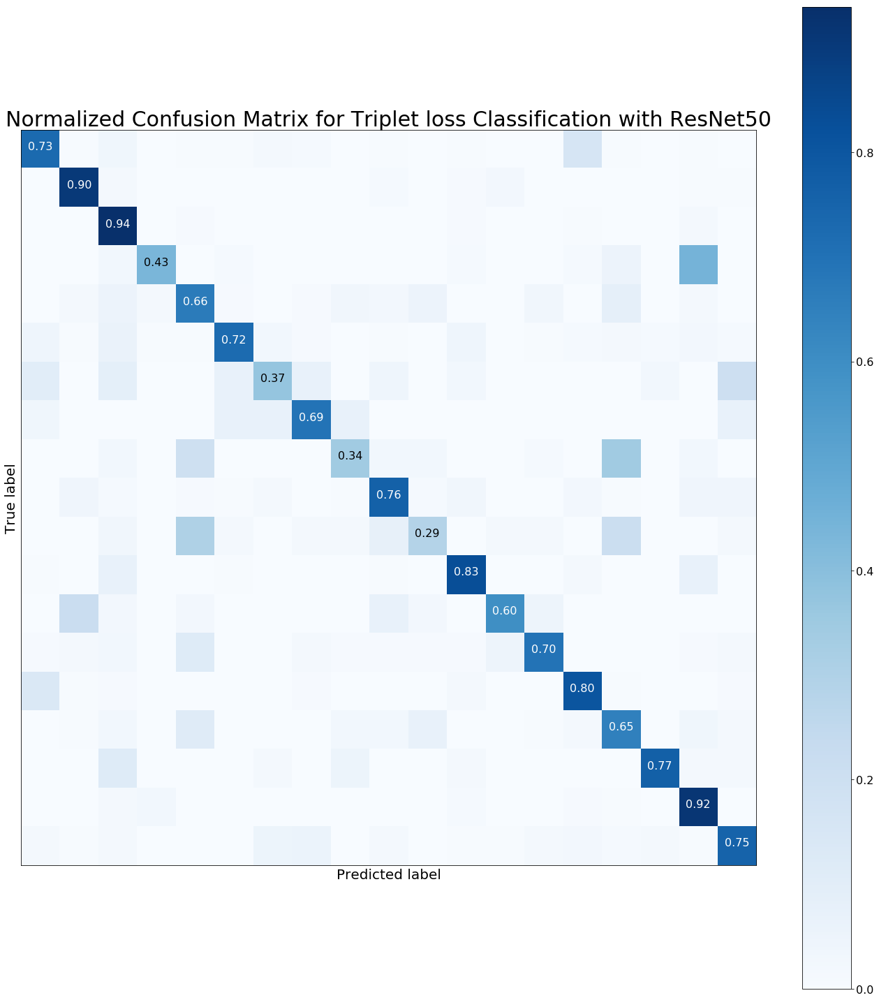

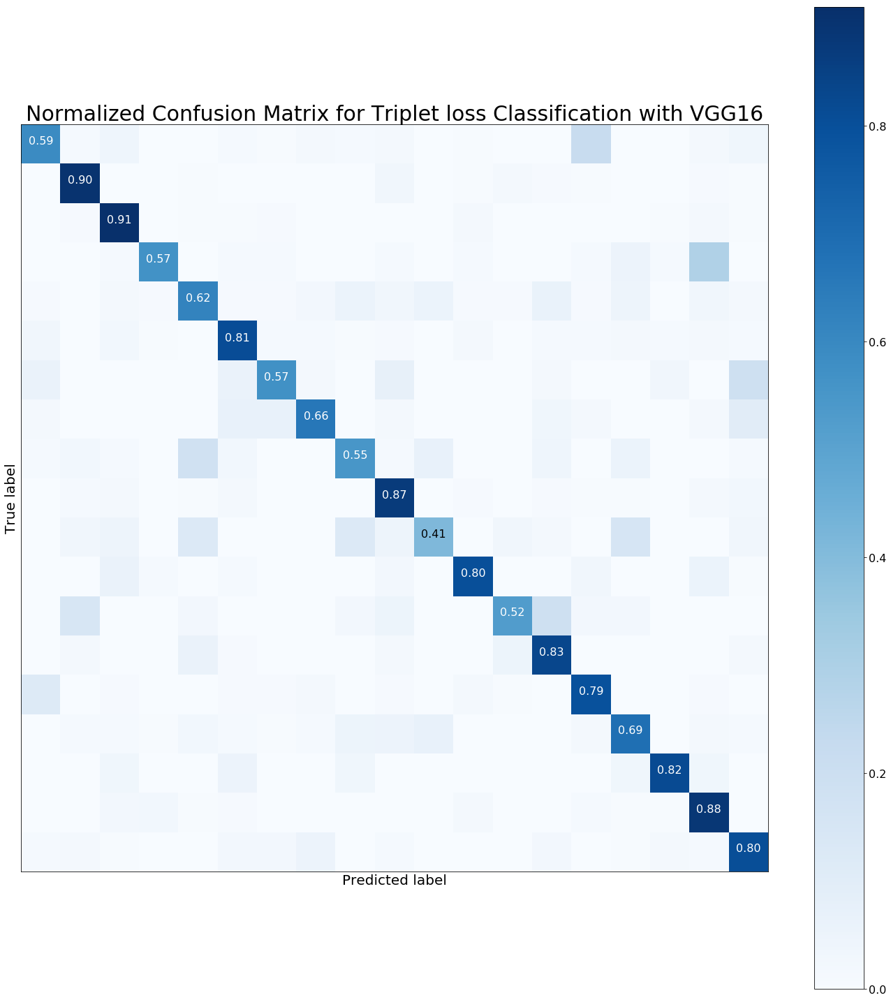

In [34]:
def normalize_CM(cm):
    total_counts = cm.sum(axis=1)
    normalized = np.copy(cm.astype(float))
    for i in range(len(total_counts)):
        normalized[i] = cm[i].astype(float)/total_counts[i]
    return normalized


def plot_confusion_matrix(cm, title='Confusion matrix', cmap=plt.cm.Blues):

    plt.figure(figsize=(20,20))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=30)
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=16) 


    plt.ylabel('True label', fontsize=20)
    plt.xlabel('Predicted label', fontsize=20)
    plt.tight_layout()
    
    plt.tick_params(
    axis='both',
    which='both',      
    bottom=False, 
    left=False,
    labelbottom=False,
    labelleft=False)
    
    thresh = cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if i==j:
            plt.text(j, i, format(cm[i, j], '.2f'), horizontalalignment="center", fontsize=16, 
                     color="white" if cm[i, j] > thresh else "black")

print('ResNet50 Triplet loss Confusion Matrix')
resnet_triplet_CM = confusion_matrix(ground_truth, resnet_predicted_labels)
print(resnet_triplet_CM)
resnet_triplet_CM_normalized = normalize_CM(resnet_triplet_CM)
plot_confusion_matrix(resnet_triplet_CM_normalized, 'Normalized Confusion Matrix for Triplet loss Classification with ResNet50')
print('ResNet50 Triplet loss Classification Report')
resnet_triplet_CR = classification_report(ground_truth, resnet_predicted_labels)
print(resnet_triplet_CR)
            
            
print('VGG16 Triplet loss Confusion Matrix')
vgg_triplet_CM = confusion_matrix(ground_truth, vgg_predicted_labels)
print(vgg_triplet_CM)
vgg_triplet_CM_normalized = normalize_CM(vgg_triplet_CM)
plot_confusion_matrix(vgg_triplet_CM_normalized, 'Normalized Confusion Matrix for Triplet loss Classification with VGG16')
print('VGG16 Triplet loss Classification Report')
vgg_triplet_CR = classification_report(ground_truth, vgg_predicted_labels)
print(vgg_triplet_CR)

## Summary of Results

Go back to [Table of Contents](#Table-of-Contents)

We make the following key observations for our models:

- [Superior Performance of Triplet Loss Classifier over Softmax Classifier](#Superior-Performance-of-Triplet-Loss-Classifier-over-Softmax-Classifier)
- [Similar Perfomance with ResNet50 and VGG16](#Similar-Perfomance-with-ResNet50-and-VGG16)
- [Triplet Loss Generalization](#Triplet-Loss-Generalization)

In [3]:
%%html
<style>
table {float:left}
</style>

### Superior Performance of Triplet Loss Classifier over Softmax Classifier

As summarized in the table below, we observe that the triplet loss classifier has a better performance on the test sets over the softmax classifier.

**Classification F1-scores**

|  Architecture    | F1-score  |
|------------------|---------- |
| ResNet50 Softmax | 0.67      |
| ResNet50 Triplet | 0.67      |
| VGG16 Softmax    | 0.80      |
| VGG16 Triplet    | 0.81      |

Due to the nature of the classification task, the image features extracted from the base CNN are likely to be quite similar. We interpret this superior performance of the triplet loss classifier as its ability to **learn a metric that better maximize inter-class and minimize intra-class distances**.

**Summary of training**

|  Architecture    |Epochs | Training Acc.  | Training Loss | Val Acc.  | Val-loss |
|------------------|---|---------- |-------------- |--------- |----------|
| ResNet50 Softmax |10| 0.81      | 0.29          | 0.70     | 0.60     |
| ResNet50 Triplet |8|  -        | 0.13          |    -     | 0.18     |
| VGG16 Softmax    |15| 0.81      | 0.71          | 0.78     | 0.59     |
| VGG16 Triplet    |8| -         | 0.09          |    -     | 0.17     |

### Similar Perfomance with ResNet50 and VGG16

In the table above, the VGG16 softmax classifier have a better validation accuracy over the ResNet50 softmax classifier whereas otherwise the two have a similar accuracy or loss. Despite the better validation accuracy during softmax classifier training, the performance on the test set of the two pre-trained CNNs are on par, both with a F1-score of 0.67.

For further detailed classification reports, please refer to the tables below.

**Classification Report for Softmax Cross Entropy Loss with ResNet50**

| Family          	| Precision 	| Recall 	| F1-Score 	| Support 	|
|-----------------	|-----------	|--------	|----------	|---------	|
| Accipitridae    	| 0.75      	| 0.64   	| 0.69     	| 147     	|
| Alcedinidae     	| 0.67      	| 0.31   	| 0.42     	| 334     	|
| Ardeidae        	| 0.86      	| 0.93   	| 0.89     	| 888     	|
| Charadriidae    	| 0.61      	| 0.37   	| 0.46     	| 76      	|
| Cisticolidae    	| 0.55      	| 0.44   	| 0.49     	| 131     	|
| Columbidae      	| 0.94      	| 0.47   	| 0.62     	| 258     	|
| Corvidae        	| 0.47      	| 0.10    	| 0.16     	| 70      	|
| Cuculidae       	| 0.87      	| 0.44   	| 0.58     	| 59      	|
| Estrildidae     	| 0.39      	| 0.34   	| 0.36     	| 73      	|
| Hirundinidae    	| 0.49      	| 0.68   	| 0.57     	| 214     	|
| Laniidae        	| 0.35      	| 0.67   	| 0.46     	| 66      	|
| Laridae         	| 0.53      	| 0.79   	| 0.63     	| 166     	|
| Meropidae       	| 0.29      	| 0.76   	| 0.42     	| 42      	|
| Nectariniidae   	| 0.32      	| 0.47   	| 0.38     	| 105     	|
| Pandionidae     	| 0.74      	| 0.73   	| 0.74     	| 209     	|
| Passeridae      	| 0.57      	| 0.28   	| 0.37     	| 151     	|
| Rallidae        	| 0.82      	| 0.55   	| 0.66     	| 60      	|
| Scolopacidae    	| 0.78      	| 0.94   	| 0.85     	| 702     	|
| Sturnidae       	| 0.59      	| 0.66   	| 0.63     	| 179     	|
| Average / Total 	| 0.71      	| 0.69   	| 0.67     	| 3930    	|

**Classification Report for Softmax Cross Entropy Loss with VGG16**

| Family          	| Precision 	| Recall 	| F1-Score 	| Support 	|
|-----------------	|-----------	|--------	|----------	|---------	|
| Accipitridae    	| 0.83      	| 0.44   	| 0.58     	| 147     	|
| Alcedinidae     	| 0.48      	| 0.78   	| 0.60     	| 334     	|
| Ardeidae        	| 0.92      	| 0.82   	| 0.87     	| 888     	|
| Charadriidae    	| 0.64      	| 0.55   	| 0.59     	| 76      	|
| Cisticolidae    	| 0.59      	| 0.34   	| 0.43     	| 131     	|
| Columbidae      	| 0.78      	| 0.67   	| 0.72     	| 258     	|
| Corvidae        	| 0.4       	| 0.27   	| 0.32     	| 70      	|
| Cuculidae       	| 0.56      	| 0.47   	| 0.51     	| 59      	|
| Estrildidae     	| 0.47      	| 0.21   	| 0.29     	| 73      	|
| Hirundinidae    	| 0.41      	| 0.50    	| 0.45     	| 214     	|
| Laniidae        	| 0.43      	| 0.30    	| 0.36     	| 66      	|
| Laridae         	| 0.58      	| 0.72   	| 0.64     	| 166     	|
| Meropidae       	| 0.41      	| 0.69   	| 0.52     	| 42      	|
| Nectariniidae   	| 0.66          | 0.35    	| 0.46   	| 105      	|
| Pandionidae     	| 0.67      	| 0.89   	| 0.76     	| 209     	|
| Passeridae      	| 0.48      	| 0.15   	| 0.22     	| 151     	|
| Rallidae        	| 0.65      	| 0.47   	| 0.54     	| 60      	|
| Scolopacidae    	| 0.83      	| 0.89   	| 0.86     	| 702     	|
| Sturnidae       	| 0.50       	| 0.75   	| 0.60     	| 179     	|
| Average / Total 	| 0.70       	| 0.68   	| 0.67     	| 3930    	|

**Classification Report for Triplet Loss with ResNet50**

| Family          	| Precision 	| Recall 	| F1-Score 	| Support 	|
|-----------------	|-----------	|--------	|----------	|---------	|
| Accipitridae    	| 0.65      	| 0.73   	| 0.69     	| 147     	|
| Alcedinidae     	| 0.91      	| 0.90    	| 0.91     	| 334     	|
| Ardeidae        	| 0.90       	| 0.94   	| 0.92     	| 888     	|
| Charadriidae    	| 0.60       	| 0.43   	| 0.50     	| 76      	|
| Cisticolidae    	| 0.53      	| 0.66   	| 0.59     	| 131     	|
| Columbidae      	| 0.91      	| 0.72   	| 0.81     	| 258     	|
| Corvidae        	| 0.46      	| 0.37   	| 0.41     	| 70      	|
| Cuculidae       	| 0.60       	| 0.69   	| 0.65     	| 59      	|
| Estrildidae     	| 0.57      	| 0.34   	| 0.43     	| 73      	|
| Hirundinidae    	| 0.84      	| 0.76   	| 0.80     	| 214     	|
| Laniidae        	| 0.41      	| 0.29   	| 0.34     	| 66      	|
| Laridae         	| 0.73      	| 0.83   	| 0.78     	| 166     	|
| Meropidae       	| 0.62      	| 0.60    	| 0.61     	| 42      	|
| Nectariniidae   	| 0.84      	| 0.70    	| 0.76     	| 105     	|
| Pandionidae     	| 0.75      	| 0.80    	| 0.78     	| 209     	|
| Passeridae      	| 0.60       	| 0.65   	| 0.62     	| 151     	|
| Rallidae        	| 0.81      	| 0.77   	| 0.79     	| 60      	|
| Scolopacidae    	| 0.87      	| 0.92   	| 0.89     	| 702     	|
| Sturnidae       	| 0.76      	| 0.75   	| 0.76     	| 179     	|
| Average / Total 	| 0.80       	| 0.80    	| 0.80     	| 3930    	|


**Classification Report for Triplet Loss with VGG16**

| Family            | Precision 	| Recall 	| F1-Score 	| Support 	|
|-----------------	|-----------	|--------	|----------	|---------	|
| Accipitridae    	| 0.66      	| 0.59   	| 0.63     	| 147     	|
| Alcedinidae     	| 0.91      	| 0.90    	| 0.90     	| 334     	|
| Ardeidae        	| 0.93      	| 0.91   	| 0.92     	| 888     	|
| Charadriidae    	| 0.64      	| 0.57   	| 0.6      	| 76      	|
| Cisticolidae    	| 0.64      	| 0.62   	| 0.63     	| 131     	|
| Columbidae      	| 0.82      	| 0.81   	| 0.82     	| 258     	|
| Corvidae        	| 0.61      	| 0.57   	| 0.59     	| 70      	|
| Cuculidae       	| 0.56      	| 0.66   	| 0.60     	| 59      	|
| Estrildidae     	| 0.55      	| 0.55   	| 0.55     	| 73      	|
| Hirundinidae    	| 0.78      	| 0.87   	| 0.82     	| 214     	|
| Laniidae        	| 0.55      	| 0.41   	| 0.47     	| 66      	|
| Laridae         	| 0.76      	| 0.8    	| 0.78     	| 166     	|
| Meropidae       	| 0.61      	| 0.52   	| 0.56     	| 42      	|
| Nectariniidae   	| 0.70       	| 0.83   	| 0.76     	| 105     	|
| Pandionidae     	| 0.73      	| 0.79   	| 0.76     	| 209     	|
| Passeridae      	| 0.72      	| 0.69   	| 0.71     	| 151     	|
| Rallidae        	| 0.73      	| 0.82   	| 0.77     	| 60      	|
| Scolopacidae    	| 0.89      	| 0.88   	| 0.89     	| 702     	|
| Sturnidae       	| 0.75      	| 0.80    	| 0.77     	| 179     	|
| Average / Total 	| 0.81      	| 0.81   	| 0.81     	| 3930    	|

### Triplet Loss Generalization

One of the most useful features of metric learning is the generalization ability in the form of one-shot or few-shot learning. In other words, once the metric mapping is learnt, if we wish to introduce new classes on top of the existing classes, one just need to introduce prototype images of the new classes. Classification remains a *k* nearest neighbours search in the metric spacing. Re-training is not necessary if the learnt metric generalizes well. On the other hand, the softmax classifier needs to be retrained if new classes are introduced.

To examine this, we use the learnt resnet embedding model on the complete dataset, which consists of 43 families instead of the 19 families we trained on.

In [38]:
# random seed 
np.random.seed(1)

# List all data folders for the raw images
data_folders = [f for f in os.scandir('data') if f.is_dir()]
nspecies = len(data_folders)

train_ratio = 0.8

train_paths = []
train_ids = []

test_paths = []
test_ids = []

# Create dataframes that can be used directly by Keras ImageDataGenerator class
for i in range(nspecies):
    image_list = glob(data_folders[i].path + "/*.jpg")

    # Splitting the datasets to training and testing
    train_idx = math.floor(len(image_list)*train_ratio)
    for j in range(train_idx):
        train_paths.append(image_list[j][5:])
        filename_idx = image_list[j].find('/',5)
        if filename_idx == -1:
            filename_idx = image_list[j].find('\\',5)
        train_ids.append(image_list[j][filename_idx+1:-4])
    for j in range(train_idx,len(image_list)):
        test_paths.append(image_list[j][5:])
        filename_idx = image_list[j].find('/',5)
        if filename_idx == -1:
            filename_idx = image_list[j].find('\\',5)
        test_ids.append(image_list[j][filename_idx+1:-4])
train_set = pd.DataFrame({'paths':train_paths, 'id':train_ids})
test_set = pd.DataFrame({'paths':test_paths, 'id':test_ids})

# The clean dataset is obtained by manual cleaning
dataset_clean = pd.read_csv('dataset_complete.csv')

train_set = pd.merge(train_set, dataset_clean, how='inner', on=['id'])
test_set = pd.merge(test_set, dataset_clean, how='inner', on=['id'])
train_set = train_set.sort_values(['family','species'])
test_set = test_set.sort_values(['family','species'])

In [39]:
all_species = train_set.species.unique()
all_family = train_set.family.unique()

# First we list the amount of training and testing images corresponding to each family
family_train_distribution = train_set.groupby(['family'], as_index=False).count()
family_train_distribution.drop(family_train_distribution.columns.difference(['family','paths']), 1, inplace=True)
family_train_distribution.columns=['family', '# Train Images']

family_test_distribution = test_set.groupby(['family'], as_index=False).count()
family_test_distribution.drop(family_test_distribution.columns.difference(['family','paths']), 1, inplace=True)
family_test_distribution.columns=['family', '# Test Images']

family_info = pd.merge(family_train_distribution,family_test_distribution)

# Next we list the amount of training and testing images corresponding to each species
train_distribution = train_set.groupby(['species'], as_index=False).count()
train_distribution.drop(train_distribution.columns.difference(['species','paths']), 1, inplace=True)
train_distribution.columns=['species', '# Train Images']

test_distribution = test_set.groupby(['species'], as_index=False).count()
test_distribution.drop(test_distribution.columns.difference(['species','paths']), 1, inplace=True)
test_distribution.columns=['species', '# Test Images']

species_info = pd.merge(train_distribution,test_distribution)

def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

display_side_by_side(family_info, species_info)

,family,# Train Images,# Test Images
0,Acanthizidae,19,5
1,Accipitridae,674,170
2,Acrocephalidae,27,7
3,Aegithinidae,127,32
4,Alcedinidae,1354,339
5,Apodidae,4,2
6,Ardeidae,3582,898
7,Cacatuidae,25,7
8,Campephagidae,43,12
9,Caprimulgidae,84,22


In [40]:
train_paths = {img_path: family for img_path, family in zip(train_set.paths, train_set.family)}
train_paths = sample_gen(train_paths)

test_paths = {img_path: family for img_path, family in zip(test_set.paths, test_set.family)}
test_paths = sample_gen(test_paths)

resnet_triplet_train_gen = gen(train_paths, 'ResNet')
resnet_triplet_test_gen = gen(test_paths, 'ResNet')

# Read in all images belonging to a family
def read_images(family, trainortest):
    if trainortest == 'train':
        paths = train_set['paths'][train_set['family']==family].tolist()
    elif trainortest == 'test':
        paths = test_set['paths'][test_set['family']==family].tolist()
    paths = ['./data/' + s for s in paths]
    imgs = [load_img(img_path, target_size=(image_size, image_size)) for img_path in paths]
    img_array = np.array([img_to_array(img) for img in imgs])
    return img_array


resnet_train_features = []
for i in all_family:
    imgs = read_images(i, 'train')
    resnet_train_features.append(resnet_embedding.predict(preprocess_input(imgs)))
    
resnet_train_features = np.vstack(resnet_train_features)
np.savetxt("resnet_train_features_complete.csv", resnet_train_features, delimiter=",")

resnet_test_features = []
for i in all_family:
    imgs = read_images(i, 'test')
    resnet_test_features.append(resnet_embedding.predict(preprocess_input(imgs)))

resnet_test_features = np.vstack(resnet_test_features)
np.savetxt("resnet_test_features_complete.csv", resnet_test_features, delimiter=",")

In [41]:
train_labels = []
ground_truth = []
for i in all_family:
    nspecies_i = family_info['# Train Images'][family_info.family==i].iloc[0]
    for j in range(nspecies_i):
        train_labels.append(i)
    
    nspecies_i = family_info['# Test Images'][family_info.family==i].iloc[0]
    for j in range(nspecies_i):
        ground_truth.append(i)


# k-NN classification based on the obtained embedding feature vectors
k = 11

# resnet k-nn predictions
resnet_neigh = NearestNeighbors(n_neighbors=k)
resnet_neigh.fit(resnet_train_features)
_, resnet_neighbors = resnet_neigh.kneighbors(resnet_test_features)

resnet_predicted_labels = []
for i in range(resnet_neighbors.shape[0]):
    labels = [train_labels[i] for i in resnet_neighbors[i].tolist()]
    resnet_predicted_labels.append(max(labels,key=labels.count))

ResNet50 Triplet loss Confusion Matrix
[[  0   0   0 ...   0   0   0]
 [  0 117   0 ...   1   0   0]
 [  0   0   0 ...   0   0   0]
 ...
 [  0   3   0 ... 134   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   3]]
ResNet50 Triplet loss Classification Report


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


                precision    recall  f1-score   support

  Acanthizidae       0.00      0.00      0.00         5
  Accipitridae       0.61      0.69      0.65       170
Acrocephalidae       0.00      0.00      0.00         7
  Aegithinidae       0.21      0.16      0.18        32
   Alcedinidae       0.87      0.90      0.88       339
      Apodidae       0.00      0.00      0.00         2
      Ardeidae       0.89      0.94      0.91       898
    Cacatuidae       0.00      0.00      0.00         7
 Campephagidae       0.00      0.00      0.00        12
 Caprimulgidae       1.00      0.18      0.31        22
  Charadriidae       0.52      0.38      0.44        76
 Chloropseidae       0.00      0.00      0.00         5
  Cisticolidae       0.42      0.62      0.50       134
    Columbidae       0.87      0.73      0.79       258
    Coraciidae       0.33      0.03      0.06        32
      Corvidae       0.46      0.36      0.40        70
     Cuculidae       0.45      0.65      0.53  

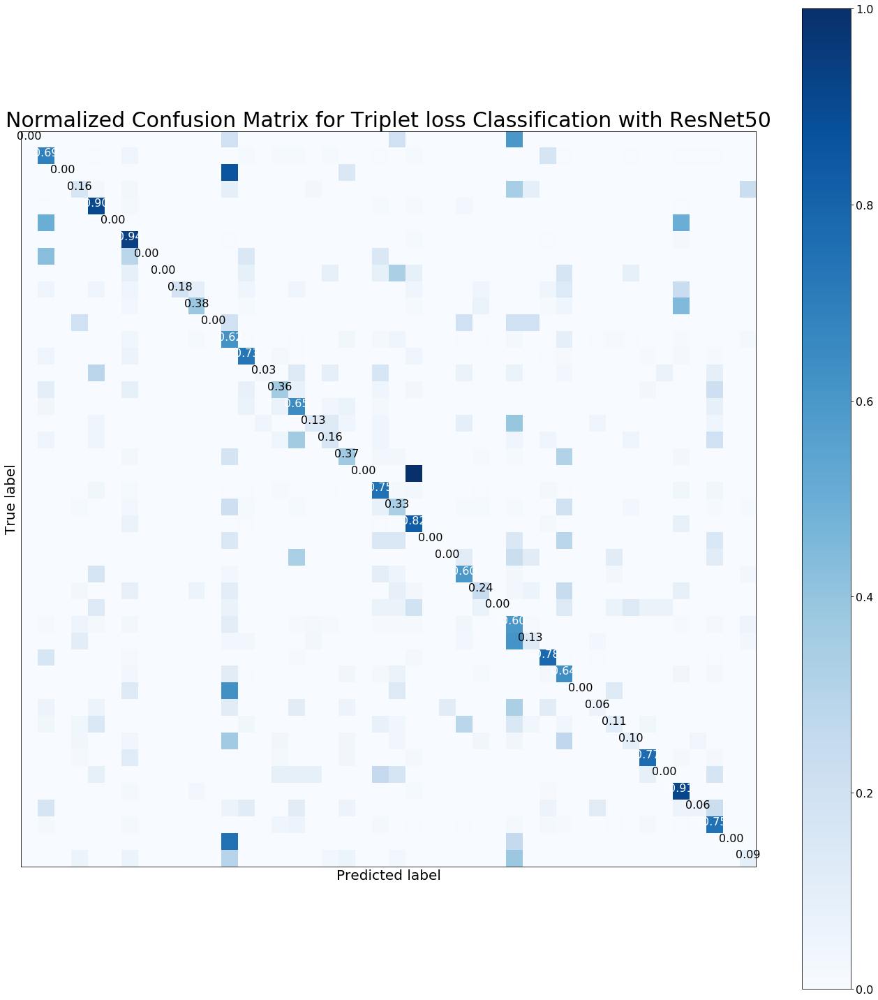

In [42]:
print('ResNet50 Triplet loss Confusion Matrix')
resnet_triplet_CM = confusion_matrix(ground_truth, resnet_predicted_labels)
print(resnet_triplet_CM)
resnet_triplet_CM_normalized = normalize_CM(resnet_triplet_CM)
plot_confusion_matrix(resnet_triplet_CM_normalized, 'Normalized Confusion Matrix for Triplet loss Classification with ResNet50')
print('ResNet50 Triplet loss Classification Report')
resnet_triplet_CR = classification_report(ground_truth, resnet_predicted_labels)
print(resnet_triplet_CR)

It can be seen that the metric learnt can generalize to some previously unknown classes with relatively more prototype images (~ at least 100). Certainly, the performance on new bird families is not ideal. But nonetheless, the generalizability of the network can be improved and such a one-shot learning feature of the metric learning loss (not requiring retraining) makes it favourable over the softmax classifier.